## **Préparez des données pour un organisme de santé publique** (2/2)

### <br> Table des matières, partie 1/2 (voir notebook 1) : nettoyage et sélection des features

<br>

- [Remarque préliminaire : avoiding missingness](#limin)

#### 1. Découvrons nos données (importation, exploration libre, début de nettoyage)

- [Importation des librairies utilisées dans ce notebook, réglage de quelques paramètres](#a1)
- [Code pour colab, décommenter si nécessaire](#colab)
- [Chargement des données : comparaison entre backend numpy (défaut) et backend pyarrow (nouveau)](#a2)
- [Chargement, affichage du résultat](#a3)
- [Premières observations : description générale du dataframe, recherche de doublons](#a4)
  <br><br>
- [Répartition des (nombreuses) valeurs manquantes : tableau](#a5)
- [Répartition des valeurs manquantes : barplot](#a6)
- [Répartition des valeurs manquantes : seuils intéressants](#a7)
- [Drop des colonnes vides ou quasi-vides](#a8)
  <br><br>
- [Features auto (pas ou très peu de valeurs manquantes) : les dates](#a9)
- [Features auto : 'creator'](#a10)
- [Valeurs manquantes en fonction des individus : visualisation](#a11)
- [Drop des lignes vides](#a12)
- [Features auto : 'states' (le retour des yaourths)](#a13)

#### 2. Nettoyage en vue d'identifier les variables les plus pertinentes

- Comment choisir ? [Revenons à notre problématique](#b1)
- Comment choisir ? [Approche technique](#b2)
- [Vérification : les features '\_n' sont-elles quantitatives ?](#b3)
- [Spoiler alert!](#b4)
  <br><br>
- [Features redondantes : nutriscore fr/uk](#b5)
- [Features redondantes : sel et sodium](#b6)
  <br><br>
- [Outliers : borne inf](#b7)
- [Outliers dans les produits sans calories](#b8)
  <br><br>
- [Outliers : borne sup - cas général (traitement rapide)](#b9)
- Outliers : borne sup - features pertinentes (traitement plus précis) : [Le sel](#b10)
  <br><br>
- [L'énergie](#b11)
- [Le gras](#b12)
- [Le sucre](#b13)
- [Les glucides](#b14)
- [Les fibres](#b15)
- [Le cholesthérol](#b16)
- [Les protéines](#b17)
- [La vitamine C](#b18)

#### 3. Choix des features

- [Utilisons la matrice de corrélations](#c1)
- [Les aliments significativement corrélés avec le nutriscore](#c2)
- [Visualisons à nouveau nos features](#c3)
- [Features numériques choisies](#c4)
  <br><br>
- [Features catégoriques](#c5)
- [Features auto : type states](#c6)
- [Features auto : type countries](#c7)
- [Additifs](#c8)
- [Autres features catégoriques](#c9)
  <br><br>
- [Features choisies : numériques et catégoriques](#c10)
- [Jointure](#c11)
- [Compression, exportation](#c12)

### <br> <a id="tic">Table des matières, partie 2/2 (ce notebook) : analyse</a>

<br>

- [Importation des librairies, réglages](#imp1)
- [Importation des données nettoyées](#imp2)

#### 4. Analyse univariée

#### 5. Analyse bivariée

#### 6. Imputation des valeurs manquantes

#### 7. ACP

<br><br>


### <a id="imp1">[Importation des librairies, réglages](#tic)</a>


In [67]:
# %pip install seaborn --upgrade

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.style as style
# style.use('seaborn-colorblind')
import seaborn as sns

import statsmodels.api as sm
import scipy.stats as st
from sklearn.model_selection import train_test_split

from collections import Counter
from zipfile import ZipFile

print('\npandas version ' + pd.__version__)
print('sns version ' + sns.__version__)

pd.set_option('display.max_columns', 200)
plt.style.use('ggplot')
rcParams["figure.figsize"] = (30,10)
rcParams["image.cmap"] = 'Pastel2_r'
rcParams['ytick.major.pad'] ='6'

sns.set()


pandas version 1.5.3
sns version 0.12.2


### <a id="imp2">[Importation des data](#tic)</a>


In [68]:
df = pd.read_csv('clean_data.csv', sep='\t', low_memory=False) 
# changer ? cette fois on connait les types


In [69]:
print(df.shape)
df.head()

(320719, 15)


,product_name,nutrition_grade_fr,pnns_groups_1,countries_fr,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g,created
0,Farine de blé noir,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-09-17 09:17:46+00:00
1,Banana Chips Sweetened (Whole),d,NaN,États-Unis,2243.0,3.57,0.00000,14.29,28.57,64.29,28.57,14.0,3.6,0.018,2017-03-09 14:32:37+00:00
2,Peanuts,b,NaN,États-Unis,1941.0,17.86,0.63500,17.86,17.86,60.71,0.00,0.0,7.1,0.000,2017-03-09 14:32:37+00:00
3,Organic Salted Nut Mix,d,NaN,États-Unis,2540.0,17.86,1.22428,3.57,57.14,17.86,5.36,12.0,7.1,NaN,2017-03-09 10:35:31+00:00
4,Organic Polenta,NaN,NaN,États-Unis,1552.0,8.57,NaN,NaN,1.43,77.14,NaN,NaN,5.7,NaN,2017-03-09 10:34:13+00:00


In [70]:
df.dtypes

product_name                object
nutrition_grade_fr          object
pnns_groups_1               object
countries_fr                object
energy_100g                float64
proteins_100g              float64
salt_100g                  float64
sugars_100g                float64
fat_100g                   float64
carbohydrates_100g         float64
saturated-fat_100g         float64
nutrition-score-fr_100g    float64
fiber_100g                 float64
cholesterol_100g           float64
created                     object
dtype: object

## 4. Analyse univariée


### Feature numériques, non-quantitatives


#### <a id="d1">[4.1 Les dates](#toc)</a>


0


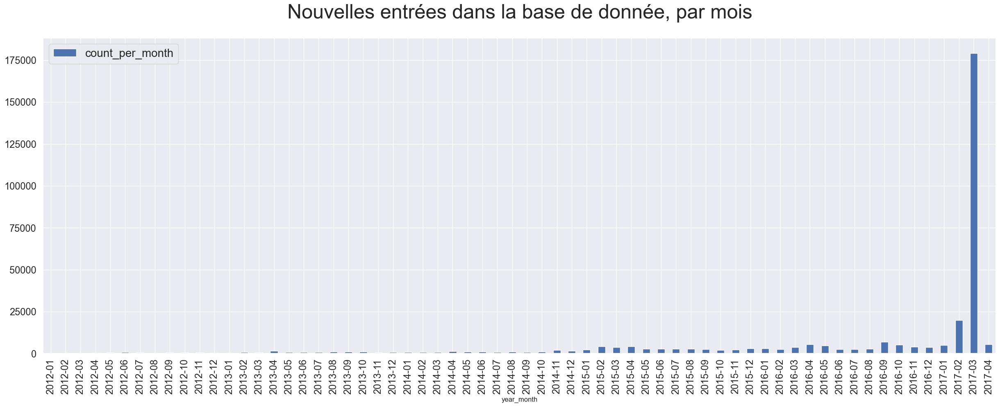

In [71]:
print(df['created'].isna().sum())

# convert column to datetime
# (csv turns dt obj into str obj)

df['created'] = pd.to_datetime(df['created'])


# create a representation of the month with strfmt
df['year_month'] = df['created'].map(lambda dt: dt.strftime('%Y-%m'))

grouped_df_month = df.groupby('year_month').size().to_frame("count_per_month").reset_index()

grouped_df_month.plot(kind='bar', x='year_month', y='count_per_month', fontsize=17)
plt.title('Nouvelles entrées dans la base de donnée, par mois', fontsize=35, pad=35)
plt.legend(loc='upper left', fontsize=20)
plt.show()


In [72]:
# ??? Il s'est passé quoi en mars 2017 ?
# 2017 est l'année où le nustriscore a été mis en place en france
# y a-t-il un lien ?
# On enquetera davantage pdt l'analyse bivariée

# Et pourquoi la collecte s'arrête en avril ?

df['year'] = df['created'].map(lambda dt: dt.strftime('%Y'))
df['year'] = df['year'].astype('uint16')

subset_2012_2014 = df.loc[df['year'] < 2015, :].copy()

print(subset_2012_2014.shape)
display(subset_2012_2014.head(15))

# 28 000 entrées en 3 ans
# soit environ 28 entrees par jour


(28214, 17)


,product_name,nutrition_grade_fr,pnns_groups_1,countries_fr,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g,created,year_month,year
177,Flute,NaN,Cereals and potatoes,Royaume-Uni,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-08-30 15:07:32+00:00,2014-08,2014
188,Thé de Noël aromatisé orange-cannelle,NaN,Beverages,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-06-11 19:03:51+00:00,2013-06,2013
217,Zumo de Piña,NaN,NaN,Espagne,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-03-04 22:02:53+00:00,2014-03,2014
222,Luxury Christmas Pudding,c,unknown,Royaume-Uni,1284.0,3.90,0.200000,44.0,7.00,54.20,3.60,10.0,4.7,NaN,2014-12-16 12:29:19+00:00,2014-12,2014
223,Luxury Christmas Pudding,c,Sugary snacks,Royaume-Uni,1284.0,3.90,0.199898,44.0,7.00,54.20,3.60,10.0,4.7,NaN,2014-12-16 12:28:35+00:00,2014-12,2014
226,"Pepsi, Nouveau goût !",e,Beverages,France,177.0,0.00,0.025400,10.4,0.00,10.40,0.00,13.0,0.0,NaN,2012-08-15 09:48:28+00:00,2012-08,2012
236,Cauliflower,NaN,Fruits and vegetables,Royaume-Uni,144.0,3.60,0.000000,2.5,0.90,2.90,NaN,NaN,1.8,NaN,2014-09-01 14:48:04+00:00,2014-09,2014
239,Salsa de mostaza,NaN,Fat and sauces,Espagne,320.0,3.60,NaN,NaN,3.50,7.50,NaN,NaN,NaN,NaN,2012-10-27 17:41:57+00:00,2012-10,2012
259,Spring Onions,NaN,Fruits and vegetables,Royaume-Uni,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-10-08 17:14:38+00:00,2014-10,2014
284,Chair à saucisse,NaN,Fish Meat Eggs,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-11-04 16:40:56+00:00,2014-11,2014


In [73]:
subset_2015_2016 = df.loc[(df['year'] > 2014) & (df['year'] < 2017), :].copy()

print(subset_2015_2016.shape)
display(subset_2015_2016.head(15))

# On monte à 120-150 par j en moyenne, 4-5 x plus, assez soudainement.
# Pourquoi ? Cette db a-t-elle gagné en notoriété ?
# ?


(83130, 17)


,product_name,nutrition_grade_fr,pnns_groups_1,countries_fr,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g,created,year_month,year
0,Farine de blé noir,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-09-17 09:17:46+00:00,2016-09,2016
46,Filet de bœuf,NaN,unknown,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-06-17 08:45:04+00:00,2015-06,2015
47,Marks % Spencer 2 Blueberry Muffins,NaN,NaN,Royaume-Uni,1513.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-08-26 15:03:02+00:00,2016-08,2016
48,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-03-17 18:17:10+00:00,2016-03,2016
106,Lion Peanut x2,e,unknown,"France,États-Unis",1883.0,2.50,0.09652,57.5,20.00,70.00,12.5,22.0,2.5,0.012,2015-01-25 21:35:01+00:00,2015-01,2015
136,Twix x2,NaN,unknown,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-01-25 21:36:13+00:00,2015-01,2015
138,Pack de 2 Twix,NaN,unknown,"France,États-Unis",1481.0,6.25,NaN,NaN,4.17,77.08,NaN,NaN,6.2,NaN,2015-01-01 21:17:31+00:00,2015-01,2015
153,"M&S Extrenely Chocolatey Milk, Dark & White Ch...",NaN,NaN,Royaume-Uni,2179.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-12-31 12:18:27+00:00,2016-12,2016
154,diet lemonade by Sainsbury's,NaN,NaN,Royaume-Uni,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-07-08 19:16:12+00:00,2016-07,2016
176,Veggie Colin the Caterpillar,NaN,NaN,Royaume-Uni,1329.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-12-30 17:07:29+00:00,2016-12,2016


In [74]:
subset_2017 = df.loc[df['year'] == 2017, :].copy()

print(subset_2017.shape)
display(subset_2017.head(60))

# les 2/3 de la db, en moins de 3 mois !
# Et cela ressemble à de la saisie auto
# A verifier en partie biv

# Bizarre l'index. Il y a deja 110 000 produits ds la db dfin 2016


(209375, 17)


,product_name,nutrition_grade_fr,pnns_groups_1,countries_fr,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g,created,year_month,year
1,Banana Chips Sweetened (Whole),d,NaN,États-Unis,2243.0,3.57,0.00000,14.29,28.57,64.29,28.57,14.0,3.6,0.018,2017-03-09 14:32:37+00:00,2017-03,2017
2,Peanuts,b,NaN,États-Unis,1941.0,17.86,0.63500,17.86,17.86,60.71,0.00,0.0,7.1,0.000,2017-03-09 14:32:37+00:00,2017-03,2017
3,Organic Salted Nut Mix,d,NaN,États-Unis,2540.0,17.86,1.22428,3.57,57.14,17.86,5.36,12.0,7.1,NaN,2017-03-09 10:35:31+00:00,2017-03,2017
4,Organic Polenta,NaN,NaN,États-Unis,1552.0,8.57,NaN,NaN,1.43,77.14,NaN,NaN,5.7,NaN,2017-03-09 10:34:13+00:00,2017-03,2017
5,Breadshop Honey Gone Nuts Granola,NaN,NaN,États-Unis,1933.0,13.46,NaN,11.54,18.27,63.46,1.92,NaN,7.7,NaN,2017-03-09 10:34:11+00:00,2017-03,2017
6,Organic Long Grain White Rice,NaN,NaN,États-Unis,1490.0,8.89,NaN,NaN,NaN,80.00,NaN,NaN,NaN,NaN,2017-03-09 10:35:30+00:00,2017-03,2017
7,Organic Muesli,c,NaN,États-Unis,1833.0,14.06,0.13970,15.62,18.75,57.81,4.69,7.0,9.4,NaN,2017-03-09 10:35:11+00:00,2017-03,2017
8,Organic Dark Chocolate Minis,NaN,NaN,États-Unis,2406.0,5.00,NaN,42.50,37.50,55.00,22.50,NaN,7.5,NaN,2017-03-09 10:34:11+00:00,2017-03,2017
9,Organic Sunflower Oil,NaN,NaN,États-Unis,3586.0,NaN,NaN,NaN,100.00,NaN,7.14,NaN,NaN,NaN,2017-03-09 10:34:14+00:00,2017-03,2017
10,Organic Adzuki Beans,NaN,NaN,États-Unis,1393.0,22.92,NaN,NaN,1.04,62.50,NaN,NaN,12.5,NaN,2017-03-09 10:35:31+00:00,2017-03,2017


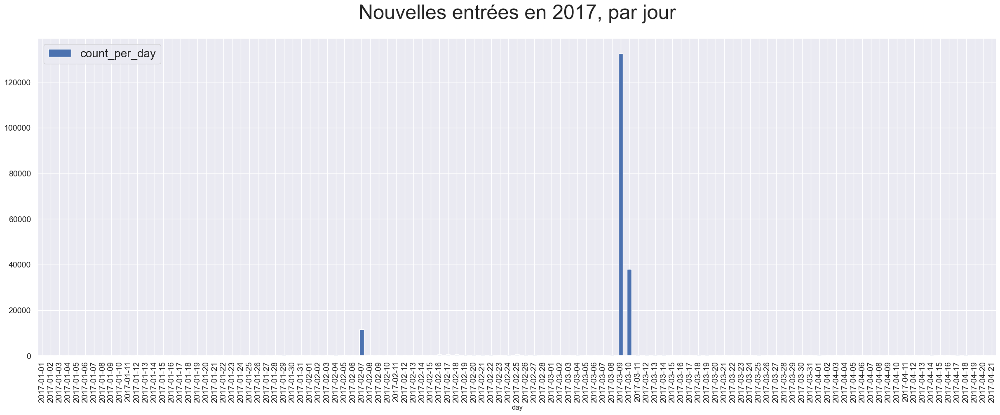

(170485, 18)


,product_name,nutrition_grade_fr,pnns_groups_1,countries_fr,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g,created,year_month,year,day
1,Banana Chips Sweetened (Whole),d,NaN,États-Unis,2243.0,3.57,0.00000,14.29,28.57,64.29,28.57,14.0,3.6,0.018,2017-03-09 14:32:37+00:00,2017-03,2017,2017-03-09
2,Peanuts,b,NaN,États-Unis,1941.0,17.86,0.63500,17.86,17.86,60.71,0.00,0.0,7.1,0.000,2017-03-09 14:32:37+00:00,2017-03,2017,2017-03-09
3,Organic Salted Nut Mix,d,NaN,États-Unis,2540.0,17.86,1.22428,3.57,57.14,17.86,5.36,12.0,7.1,NaN,2017-03-09 10:35:31+00:00,2017-03,2017,2017-03-09
4,Organic Polenta,NaN,NaN,États-Unis,1552.0,8.57,NaN,NaN,1.43,77.14,NaN,NaN,5.7,NaN,2017-03-09 10:34:13+00:00,2017-03,2017,2017-03-09
5,Breadshop Honey Gone Nuts Granola,NaN,NaN,États-Unis,1933.0,13.46,NaN,11.54,18.27,63.46,1.92,NaN,7.7,NaN,2017-03-09 10:34:11+00:00,2017-03,2017,2017-03-09


,product_name,nutrition_grade_fr,pnns_groups_1,countries_fr,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g,created,year_month,year,day
320685,Organic Z Bar,d,NaN,États-Unis,1393.0,5.56,0.95250,30.56,9.72,61.11,2.78,11.0,8.3,0.0,2017-03-09 14:32:24+00:00,2017-03,2017,2017-03-09
320689,Natural Cassava,a,NaN,États-Unis,1477.0,1.18,0.03048,2.35,0.00,87.06,0.00,-1.0,4.7,0.0,2017-03-09 20:45:00+00:00,2017-03,2017,2017-03-09
320697,Raspados Ice Bars,NaN,NaN,États-Unis,368.0,0.00,0.04572,19.30,0.00,21.05,NaN,NaN,NaN,NaN,2017-03-09 10:28:09+00:00,2017-03,2017,2017-03-09
320715,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",b,NaN,États-Unis,0.0,0.00,0.00000,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2017-03-09 11:31:16+00:00,2017-03,2017,2017-03-09
320718,"Sugar Free Drink Mix, Peach Tea",NaN,NaN,États-Unis,2092.0,0.00,0.00000,0.00,0.00,0.00,NaN,NaN,NaN,NaN,2017-03-09 15:18:29+00:00,2017-03,2017,2017-03-09


In [75]:
subset_2017['day'] = subset_2017['created'].map(lambda dt: dt.strftime('%Y-%m-%d'))

grouped_subset_2017_day = subset_2017.groupby('day').size().to_frame("count_per_day").reset_index()

grouped_subset_2017_day.plot(kind='bar', x='day', y='count_per_day', fontsize=14)
plt.title('Nouvelles entrées en 2017, par jour', fontsize=35, pad=35)
plt.legend(loc='upper left', fontsize=20)
plt.show()

# Là c plus clair !
# + de la moitié des data ont été acquises... En moins de 2 jours ! (jeudi 9 mars, ven 10 mars 2017)

# QQn a dû programmer un bot pour uploader une base de données préexistante. origine ?

subset_auto = subset_2017.loc[(subset_2017['day'] == '2017-03-09')
                              | (subset_2017['day'] == '2017-03-10'), :].copy()

print(subset_auto.shape)
display(subset_auto.head(5))
display(subset_auto.tail(5))


In [76]:
subset_auto.loc[subset_auto['countries_fr'] != 'États-Unis'].shape

# C une bd de produits americains. donc le nutriscore doit être calculé automatiquement


(625, 18)

#### <a id="d2">[4.2 Le nutriscore](#toc)</a>


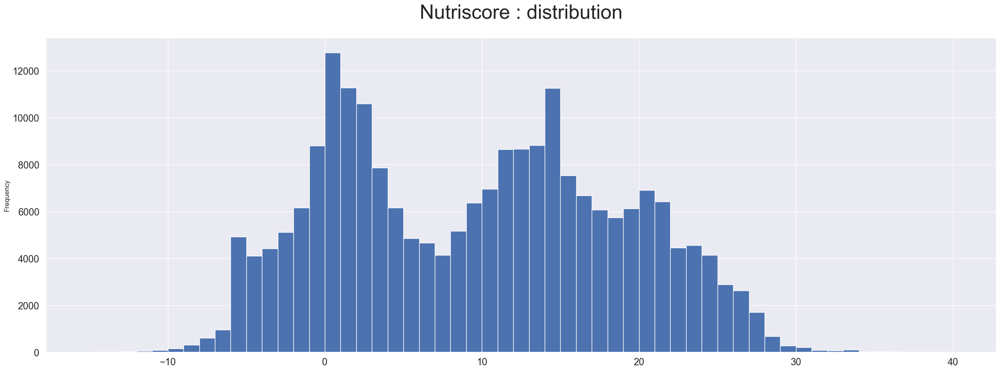

In [77]:
df['nutrition-score-fr_100g'].plot(kind='hist', bins=55, fontsize=17)

plt.title('Nutriscore : distribution', fontsize=35, pad=35)
plt.show()

# Bimodal, interessant pour analyse bi/multi


### Features numériques et quantitatives


#### <a id="d3">[4.3 Composition des aliments](#toc)</a>


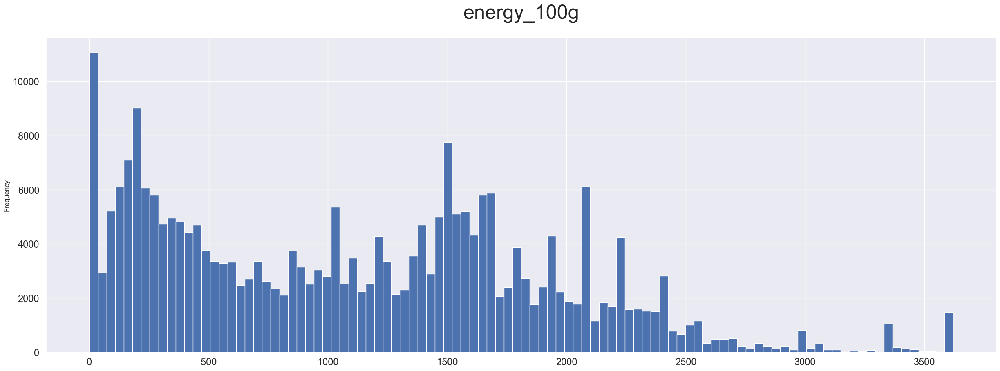

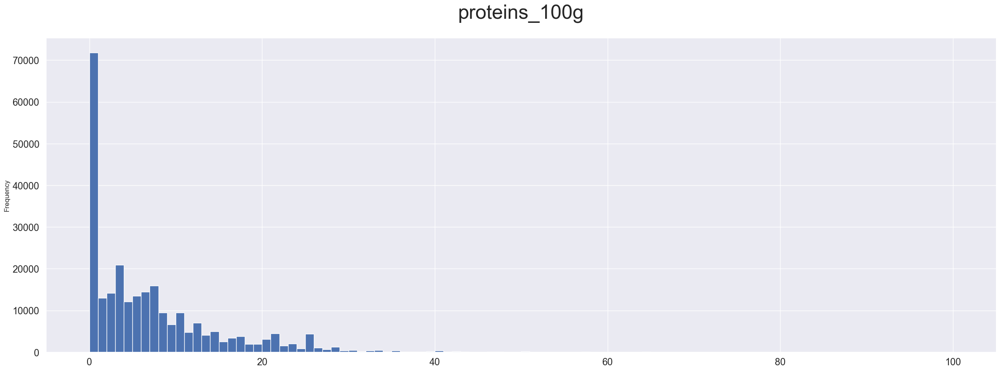

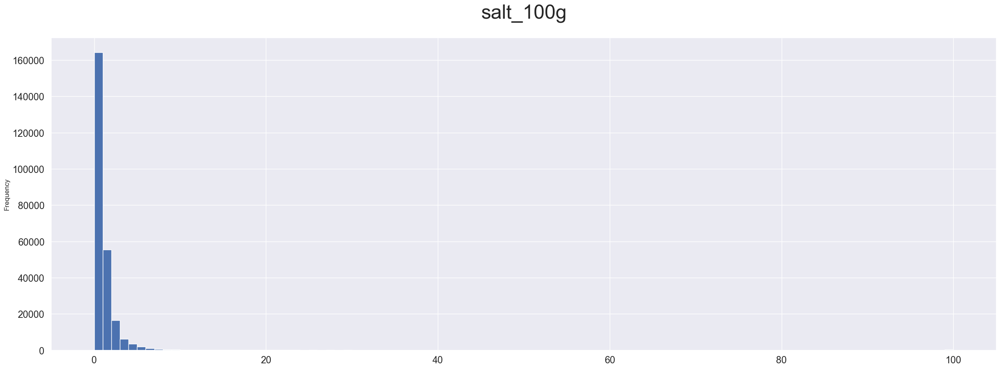

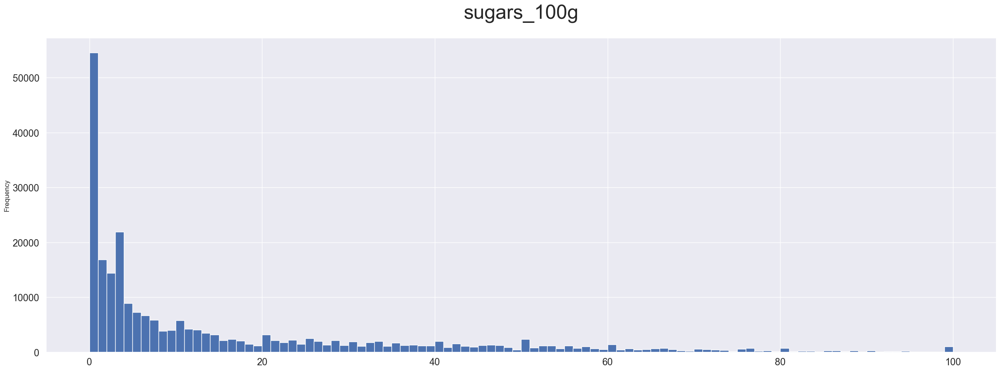

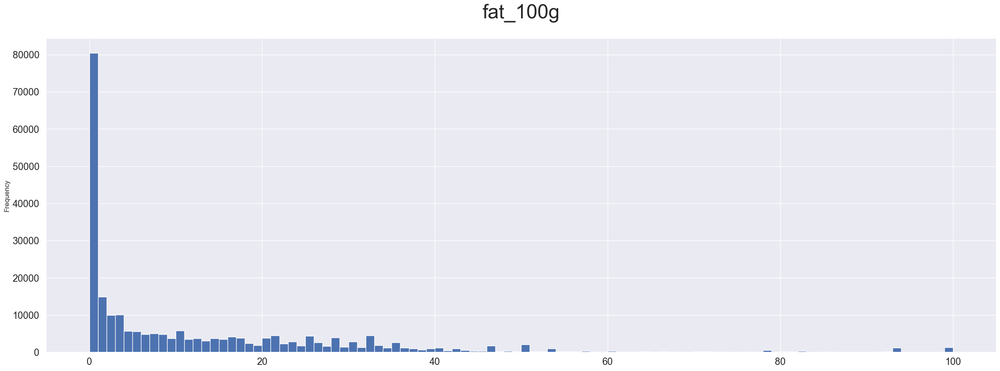

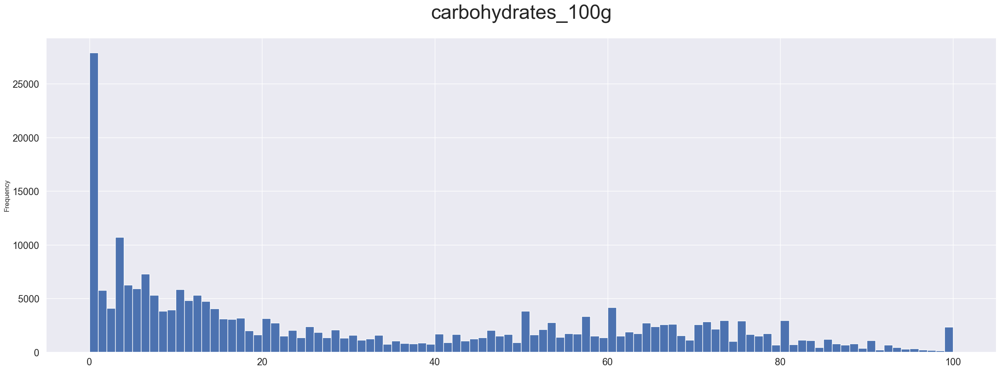

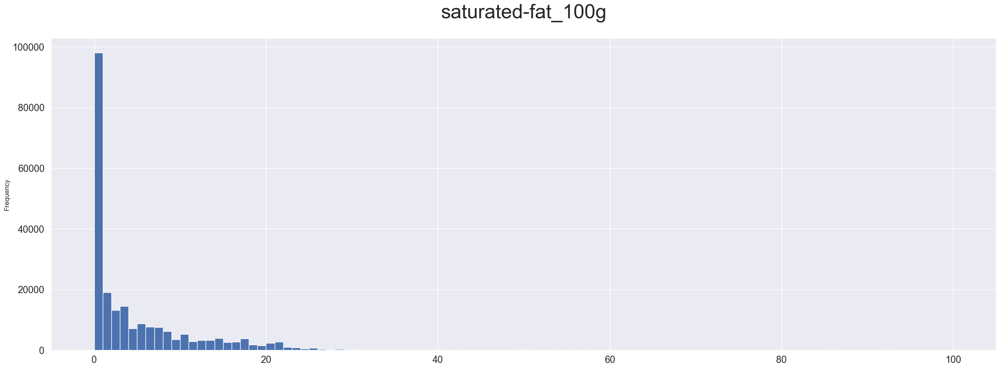

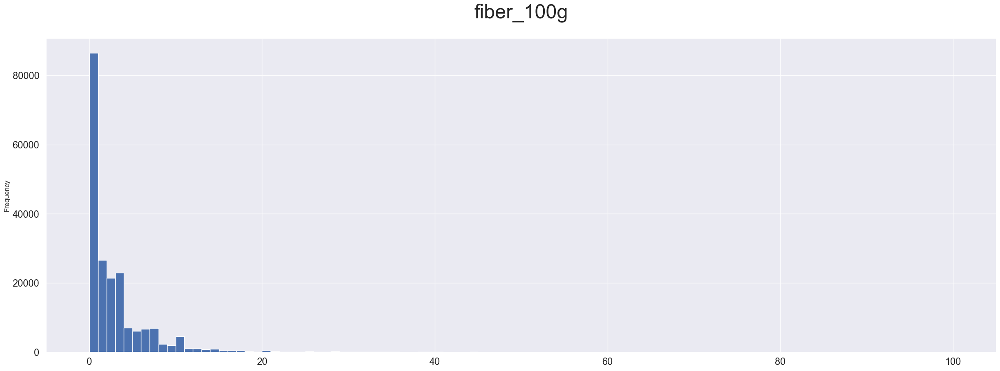

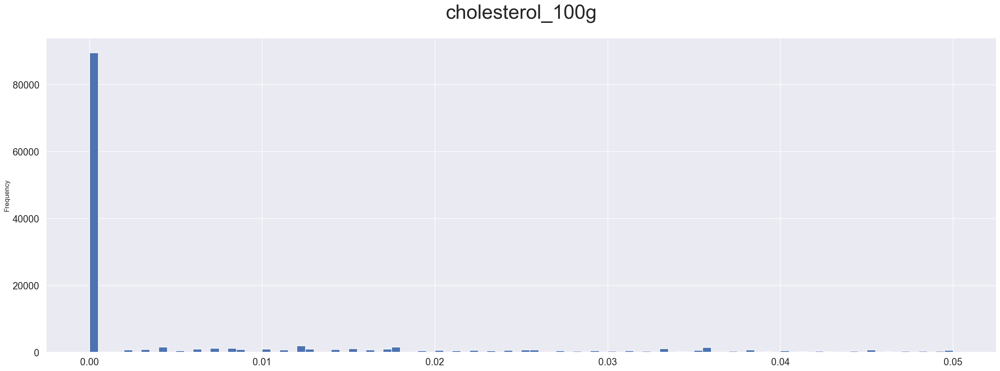

In [78]:
features_str = df.columns.str.lower().copy()
features_str = features_str.astype("string")

for feature in features_str:
    if (feature.endswith("_100g") == True) and (feature != 'nutrition-score-fr_100g'):
            df[feature].plot(kind='hist', bins=100, title=feature, fontsize=17)
            plt.title(feature, fontsize=35, pad=35)
            plt.show()


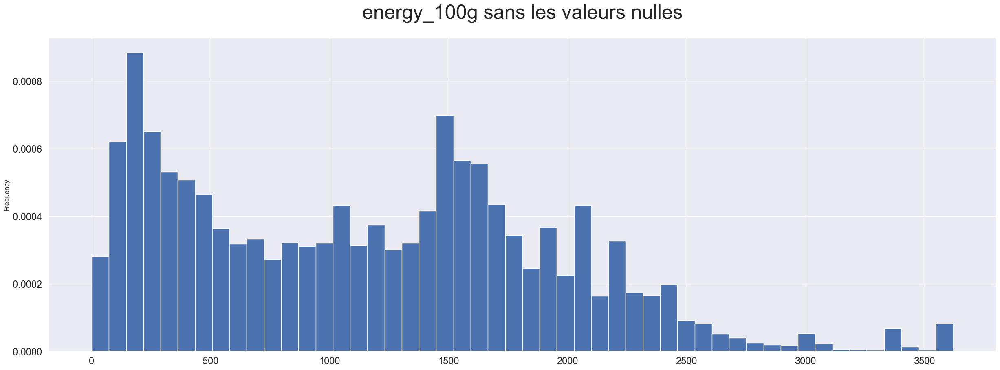

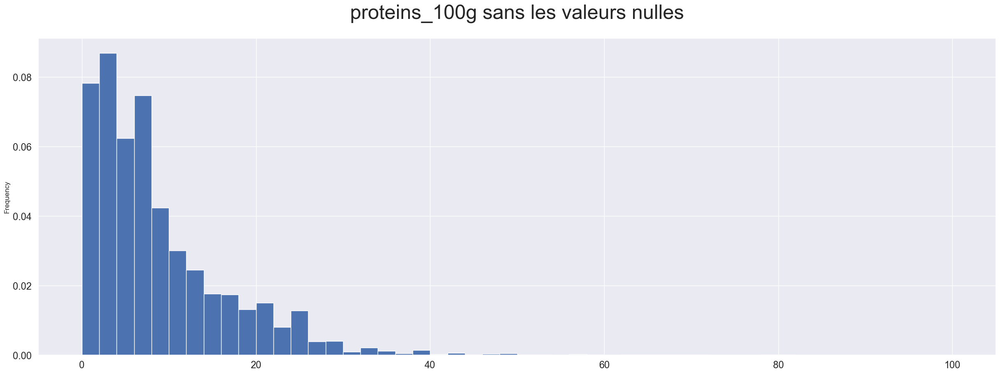

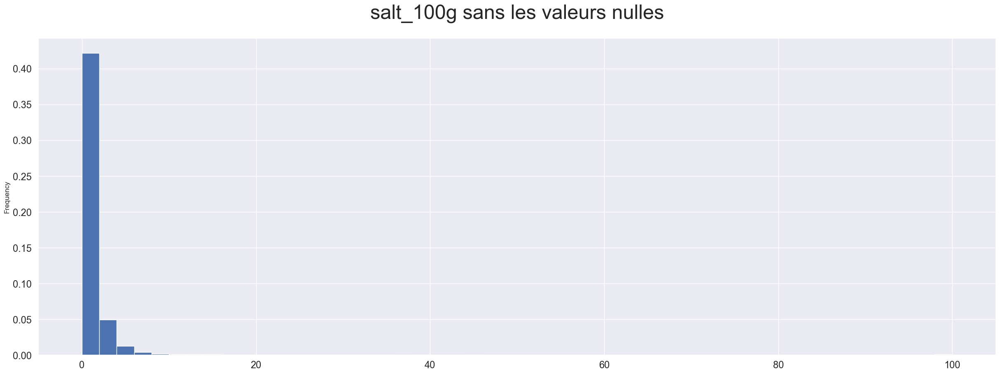

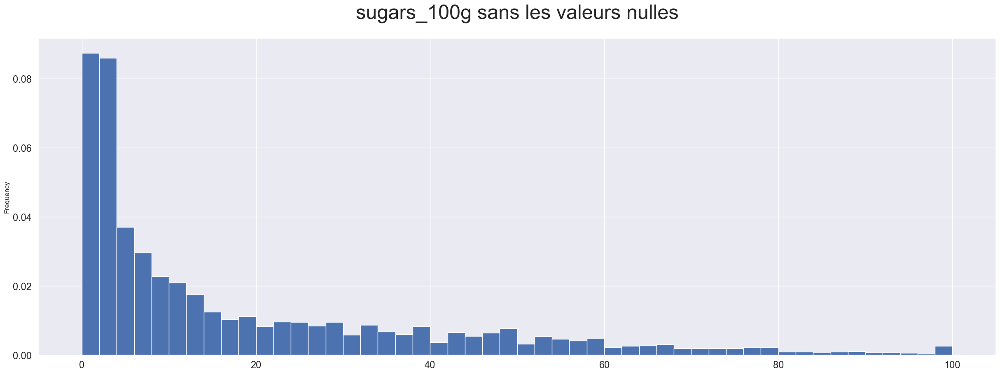

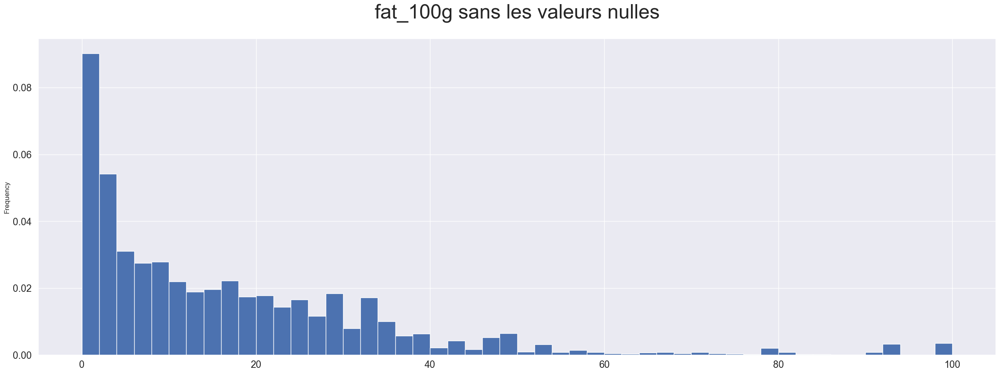

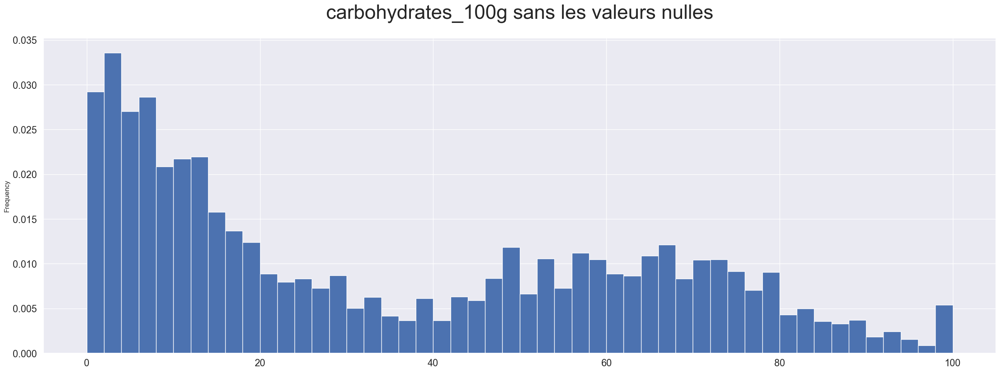

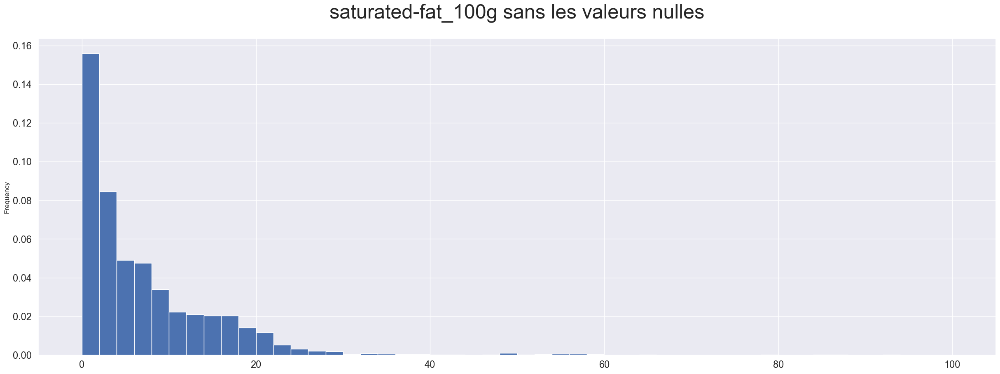

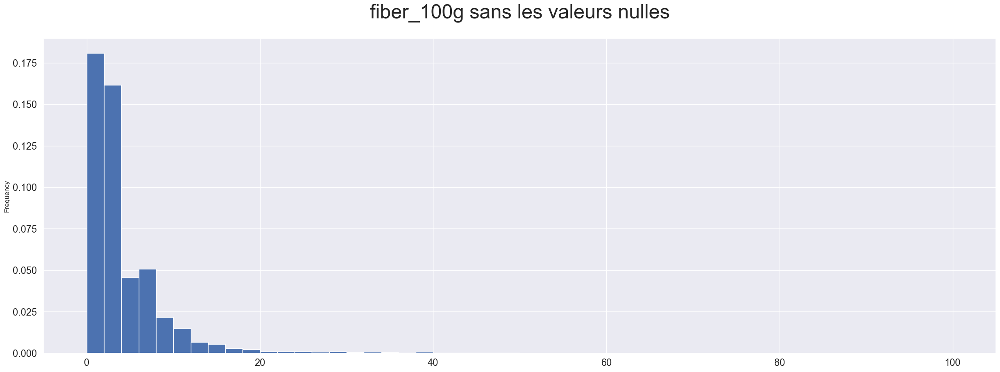

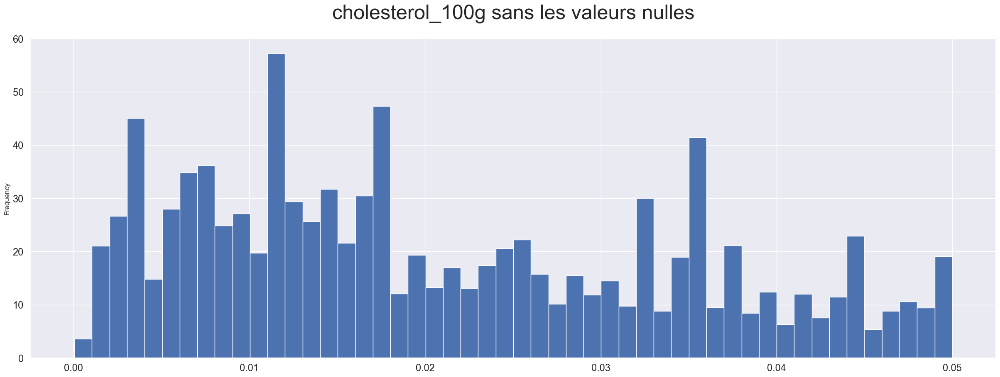

In [79]:
for feature in features_str:
    if (feature.endswith("_100g") == True) and (feature != 'nutrition-score-fr_100g'):
            df.loc[df[feature] > 0, feature].plot(kind='hist', bins=50, title=feature, fontsize=17, density=True)
            plt.title(feature + ' sans les valeurs nulles', fontsize=35, pad=35)
            plt.show()

# Il y a vrmt du sucre partout !


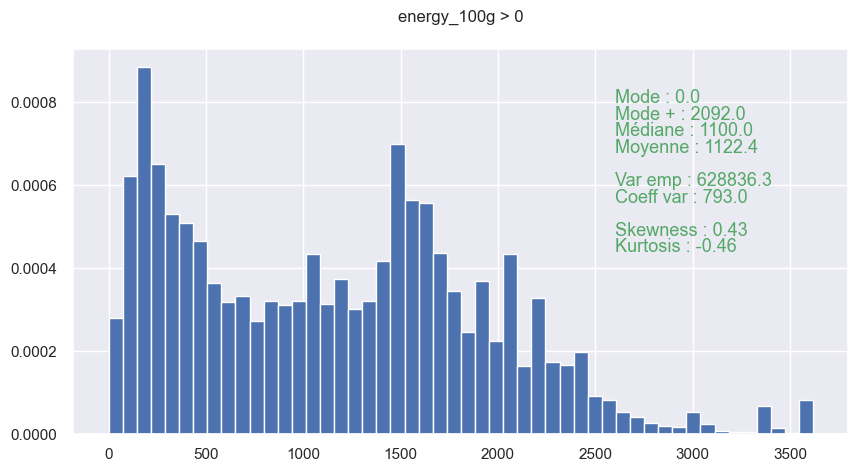

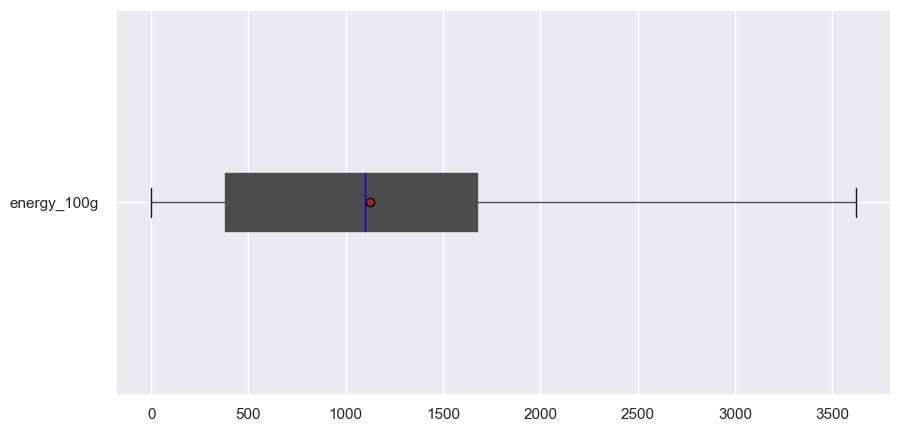

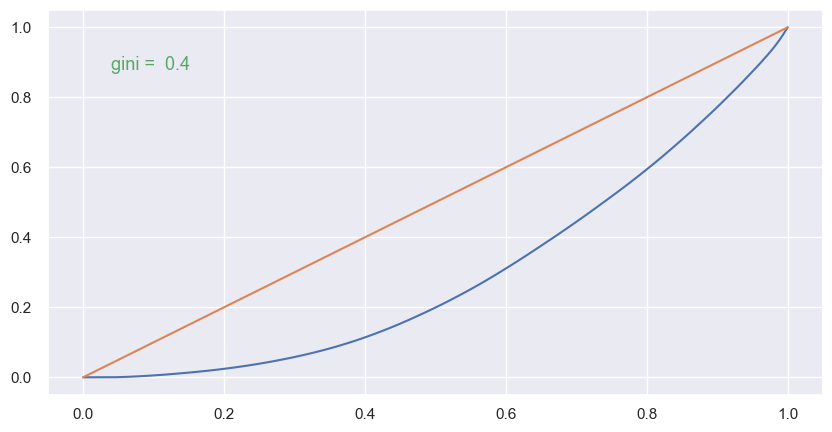

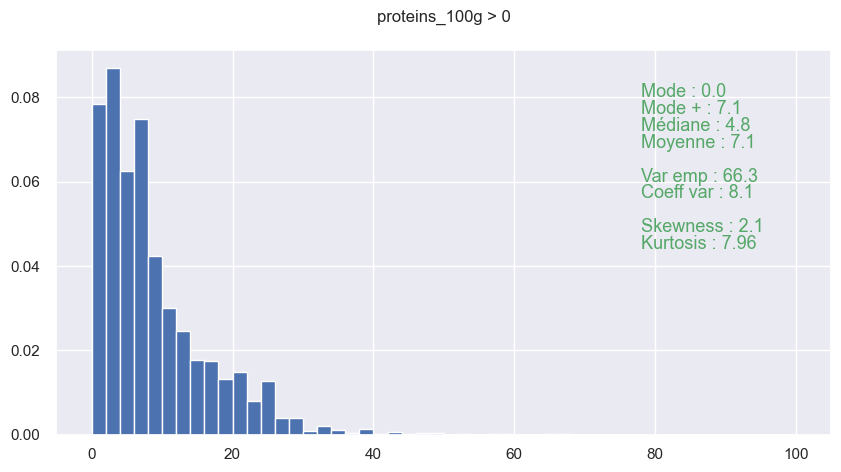

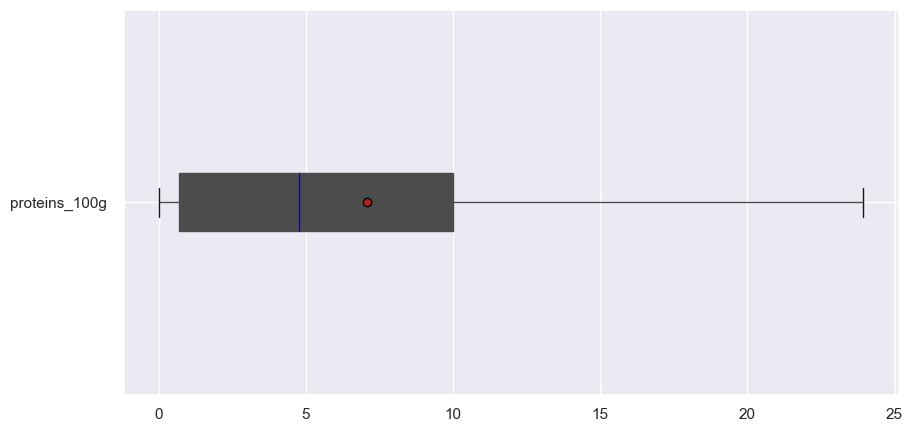

...

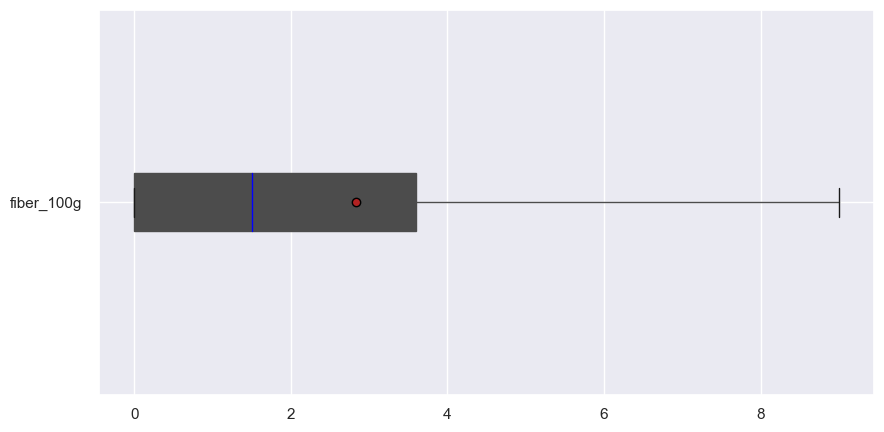

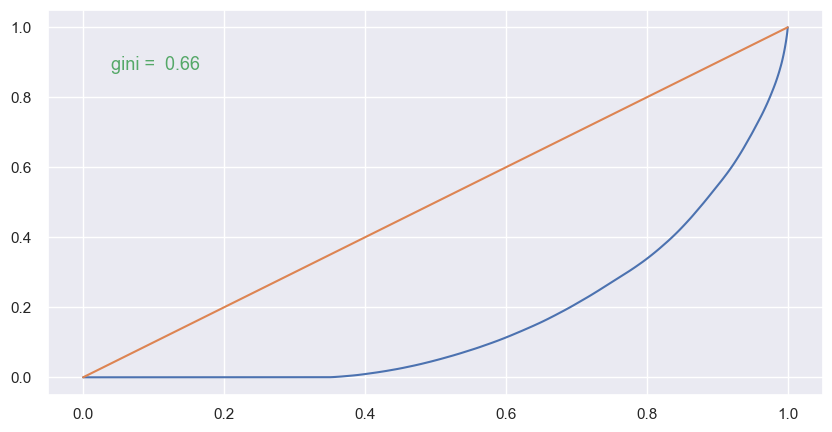

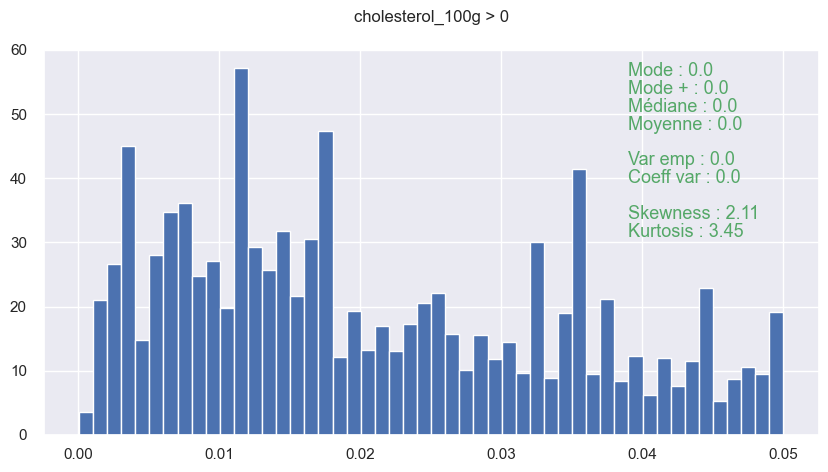

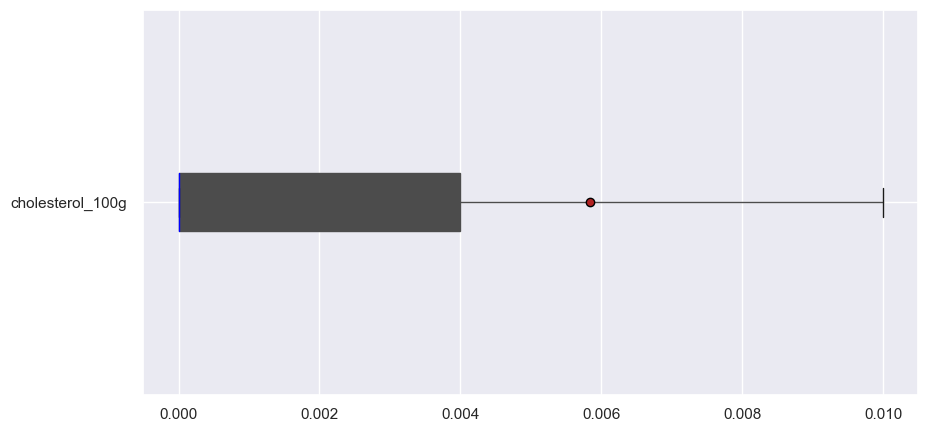

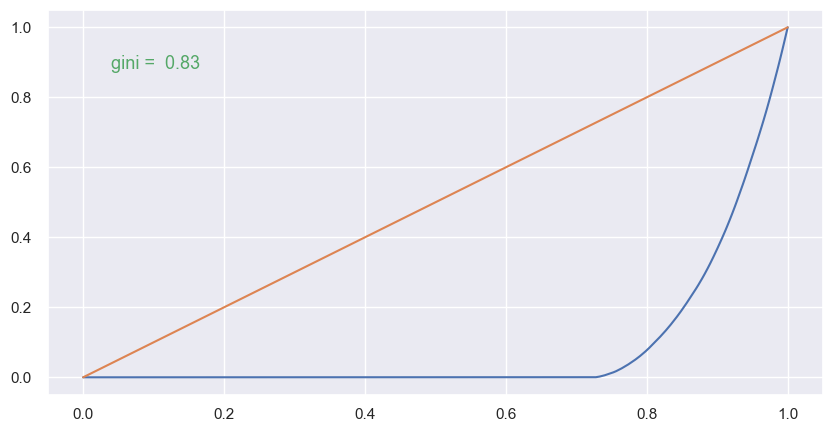

In [80]:
def hist_distrib(dataframe, feature, bins, r):
    """
    Affiche un histogramme, pour visualiser la distribution empirique d'une variable
    Argument : df, feature num
    """
    rcParams["figure.figsize"] = (10,5)
    # calcul des tendances centrales :
    mode =  str(round(dataframe[feature].mode()[0], r))
    mode_positif = str(round(dataframe.loc[df[feature] > 0, feature].mode()[0], r))
    mediane = str(round(dataframe[feature].median(), r))
    moyenne = str(round(dataframe[feature].mean(), r))
    # dispersion :
    var_emp = str(round(dataframe[feature].var(ddof=0), r))
    coeff_var =  str(round(dataframe[feature].std(ddof=0), r)) # = écart-type empirique / moyenne
    # forme
    skewness = str(round(dataframe[feature].skew(), 2))
    kurtosis = str(round(dataframe[feature].kurtosis(), 2))
    
    dataframe.loc[dataframe[feature] > 0, feature].hist(density=True, bins=bins)
    yt = plt.yticks()
    y = yt[0][-1] * 0.8
    t = y/20
    xt = plt.xticks()
    x = xt[0][-1] * 0.65
    plt.title(feature + ' > 0', pad=20)
    plt.annotate('Mode : ' + mode, xy = (x, y), fontsize = 13, xytext = (x, y), color = 'g')
    plt.annotate('Mode + : ' + mode_positif, xy = (x, y-t), fontsize = 13, xytext = (x, y-t), color = 'g')
    plt.annotate('Médiane : ' + mediane, xy = (x, y-2*t), fontsize = 13, xytext = (x, y-2*t), color = 'g')
    plt.annotate('Moyenne : ' + moyenne, xy = (x, y-3*t), fontsize = 13, xytext = (x, y-3*t), color = 'g')
    
    plt.annotate('Var emp : ' + var_emp, xy = (x, y-5*t), fontsize = 13, xytext = (x, y-5*t), color = 'g')
    plt.annotate('Coeff var : ' + coeff_var, xy = (x, y-6*t), fontsize = 13, xytext = (x, y-6*t), color = 'g')

    plt.annotate('Skewness : ' + skewness, xy = (x, y-8*t), fontsize = 13, xytext = (x, y-8*t), color = 'g')
    plt.annotate('Kurtosis : ' + kurtosis, xy = (x, y-9*t), fontsize = 13, xytext = (x, y-9*t), color = 'g')
    plt.show()

def boxplot_distrib(dataframe, feature):
    """
    Affiche un boxplot, pour visualiser les tendances centrales et la dispersion d'une variable
    Argument : feature num
    """
    medianprops = {'color':"blue"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    dataframe.boxplot(feature, vert=False, showfliers=False, medianprops=medianprops, patch_artist=True, showmeans=True, meanprops=meanprops)
    plt.show()

def courbe_lorenz(dataframe, feature):
    """
    Affiche une courbe de Lorenz, pour visualiser la concentration d'une variable
    Argument : feature num
    """
    values = dataframe.loc[dataframe[feature].notna(), feature].values
    # print(values)
    n = len(values)
    lorenz = np.cumsum(np.sort(values)) / values.sum()
    lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0

    xaxis = np.linspace(0-1/n,1+1/n,n+1) 
    #Il y a un segment de taille n pour chaque individu, plus 1 segment supplémentaire d'ordonnée 0. 
    # #Le premier segment commence à 0-1/n, et le dernier termine à 1+1/n.
    plt.plot(xaxis,lorenz,drawstyle='steps-post')
    plt.plot(np.arange(2),[x for x in np.arange(2)])
    # calcul de l'indice de Gini
    AUC = (lorenz.sum() -lorenz[-1]/2 -lorenz[0]/2)/n # Surface sous la courbe de Lorenz. Le premier segment (lorenz[0]) est à moitié en dessous de 0, on le coupe donc en 2, on fait de même pour le dernier segment lorenz[-1] qui est à moitié au dessus de 1.
    S = 0.5 - AUC # surface entre la première bissectrice et le courbe de Lorenz
    gini = 2*S
    plt.annotate('gini =  ' + str(round(gini, 2)), xy = (0.04, 0.88), fontsize = 13, xytext = (0.04, 0.88), color = 'g')
    plt.show() 

def graphs_analyse_uni(dataframe, feature, bins=50, r=1):
    """
    Affiche histogramme + boxplot + courbe de Lorenz
    Arguments : feature num, int (optional), int (optional)
    """   
    hist_distrib(dataframe, feature, bins, r)
    boxplot_distrib(dataframe, feature)
    courbe_lorenz(dataframe, feature)

for feature in features_str:
    if (feature.endswith("_100g") == True) and not (feature in ['nutrition-score-fr_100g']):
        graphs_analyse_uni(df, feature, bins=50, r=1)
  

In [81]:
# Interprétation : svt 1 pic proche de 0.
# nuancer

#  Les indicateurs de dispersion, très élevés, montrent que les indicateurs de tendances centrale sont peu robustes ici. 
# Seul le mode est relativement pertinent. 

# Le skewness et le kurtosis confirment aussi ce que l'on peut observer sur les histogrammes : 
# Nos distributions sont plus étalées à droite de la moyenne (skew positif, < 0.5), et 
# les courbes sont plus aplaties que la distribution normale (kurt négatif).


### Features catégoriques


#### <a id="d4">[4.4 Noms des produits](#toc)</a>


In [82]:
def check_text(colonne):
    """
    Compte le nombre d'occurences de chaque mot, 
    retourne un counter
    Argument : feature
    """
    copie = colonne.copy()
    copie.fillna("",inplace=True) # sinon on ne peut pas utiliser les mehodes str ensuite
    copie = copie.astype("string")
    results = Counter()
    copie.str.lower().str.split().apply(results.update)
    print(len(results))
    print(results)

check_text(df['product_name'])

print(df['product_name'].nunique())

# Comment visaliser ? c bcp
# On utilisera pour des subset ou en bivarié


66031
Counter({'de': 27203, '&': 18465, 'chocolate': 10790, 'cheese': 9714, 'sauce': 9281, 'organic': 9274, 'with': 8407, 'au': 8094, 'à': 6317, 'mix': 5530, 'milk': 5002, 'la': 4824, 'fruit': 4676, 'chocolat': 4659, 'cream': 4610, 'et': 4368, '-': 4310, 'chicken': 4301, 'aux': 4177, 'bio': 3916, 'butter': 3894, 'in': 3804, 'whole': 3763, 'sweet': 3716, 'ice': 3712, 'original': 3706, 'juice': 3603, 'white': 3482, 'lait': 3444, 'premium': 3393, 'chips': 3371, 'extra': 3361, 'natural': 3344, 'style': 3272, 'cookies': 3193, 'roasted': 3181, 'beans': 3150, 'candy': 3124, 'rice': 3115, 'oil': 2956, 'orange': 2929, 'and': 2904, 'hot': 2893, 'cheddar': 2889, 'honey': 2849, 'apple': 2816, '100%': 2791, 'dark': 2789, 'green': 2781, 'corn': 2768, 'potato': 2717, 'mini': 2697, 'water': 2608, 'beef': 2588, 'tea': 2577, 'caramel': 2560, 'red': 2490, 'coconut': 2466, 'bread': 2426, 'vanilla': 2417, 'yogurt': 2415, 'peanut': 2413, 'strawberry': 2360, 'light': 2247, 'pasta': 2231, 'salt': 2207, 'black

#### <a id="d5">[4.5 Origine](#toc)</a>


In [83]:
check_text(df['countries_fr'])

print(df['countries_fr'].nunique())



752
Counter({'états-unis': 172999, 'france': 94392, 'suisse': 14953, 'allemagne': 7870, 'espagne': 5009, 'royaume-uni': 4823, 'belgique': 2595, 'australie': 2056, 'russie': 1315, 'france,suisse': 1224, 'italie': 1213, 'canada': 888, 'portugal': 674, 'pays-bas': 558, 'france,royaume-uni': 514, 'belgique,france': 512, 'autriche': 379, 'brésil': 336, 'république': 308, 'tchèque': 275, 'danemark': 253, 'hongrie': 249, 'france,allemagne': 240, 'thaïlande': 240, 'france,états-unis': 221, 'allemagne,suisse': 218, 'réunion': 214, 'roumanie': 209, 'irlande': 187, 'japon': 178, 'chine': 177, 'luxembourg': 165, 'maroc': 154, 'la': 150, 'taiwan': 148, 'france,espagne': 146, 'tunisie': 139, 'hong': 138, 'kong': 137, 'algérie': 137, 'pologne': 135, 'suède': 107, 'guadeloupe': 106, 'chili': 101, 'france,guadeloupe': 94, 'belgique,france,suisse': 93, 'nouvelle-calédonie': 90, 'norvège': 89, 'nouvelle-zélande': 87, 'serbie': 83, 'martinique': 80, 'saoudite': 79, 'du': 79, 'arabie': 78, 'arabes': 77, 'u

['Allemagne', 'Belgique', 'Espagne', 'France', 'Royaume-Uni', 'Suisse', 'États-Unis']


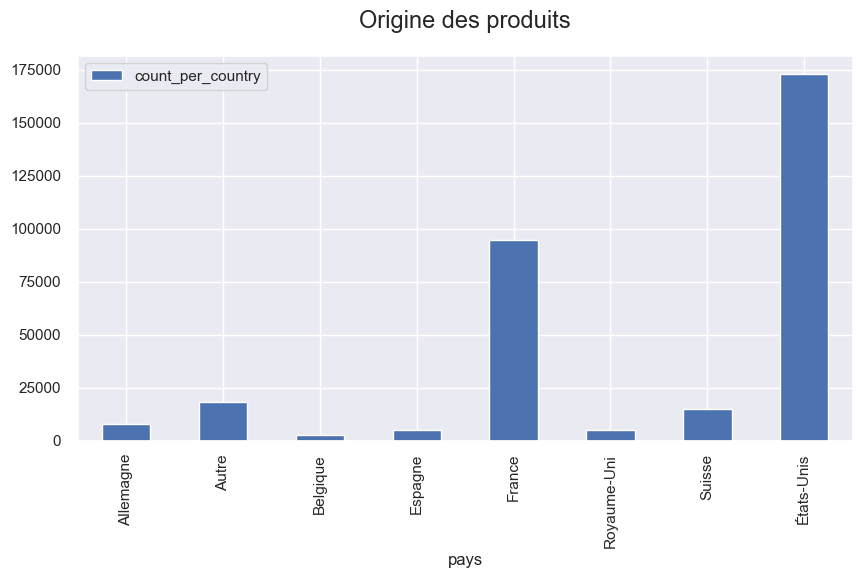

In [84]:
grouped_df_countries = df.groupby('countries_fr').size().to_frame("count_per_country").reset_index()

big_countries = grouped_df_countries.loc[grouped_df_countries['count_per_country'] > 2500, 'countries_fr'].tolist()
print(big_countries)

df['pays'] = df['countries_fr']
df.loc[~df['pays'].isin(big_countries), 'pays'] = 'Autre'

grouped_df_countries = df.groupby('pays').size().to_frame("count_per_country").reset_index()
# display(grouped_df_countries.tail(65))

grouped_df_countries.plot(kind='bar', x='pays', y='count_per_country')
plt.title('Origine des produits', pad=20, fontsize=17)
plt.show()

# c l'occasion de faire un piechart


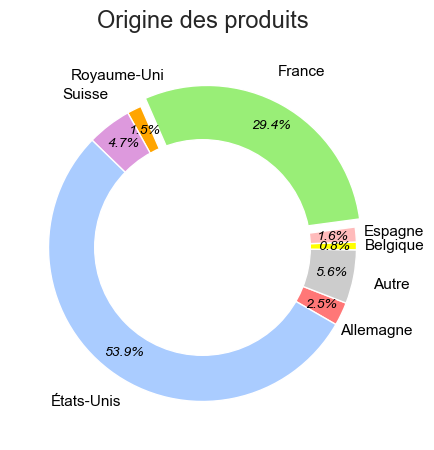

In [85]:
grouped_df_countries['france'] = 0
grouped_df_countries.loc[grouped_df_countries['pays'] == 'France', 'france'] = 0.06

grouped_df_countries_pie = grouped_df_countries.set_index('pays').copy()

patches, texts, autotexts = plt.pie(x=grouped_df_countries_pie['count_per_country'], autopct='%1.1f%%',
        startangle=-30, explode=grouped_df_countries_pie['france'], 
        labels=grouped_df_countries_pie.index, textprops={'fontsize':11, 'color':'#000'}, labeldistance=1.25,
        pctdistance=0.85, colors=['#f77','#ccc','yellow','#fbb','#9e7','orange','#d9d','#acf'])
plt.title(
    label="Origine des produits", 
    fontdict={"fontsize":17},
    pad=20
)

for text in texts:
    # text.set_fontweight('bold')
    text.set_horizontalalignment('center')
# Customize percent labels
for autotext in autotexts:
    autotext.set_horizontalalignment('center')
    autotext.set_fontstyle('italic')
    autotext.set_fontsize('10')
#draw circle
centre_circle = plt.Circle((0,0),0.7,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.show()

#### <a id="d6">[4.6 Valeur nutritionnelle (nutrigrade)](#toc)</a>


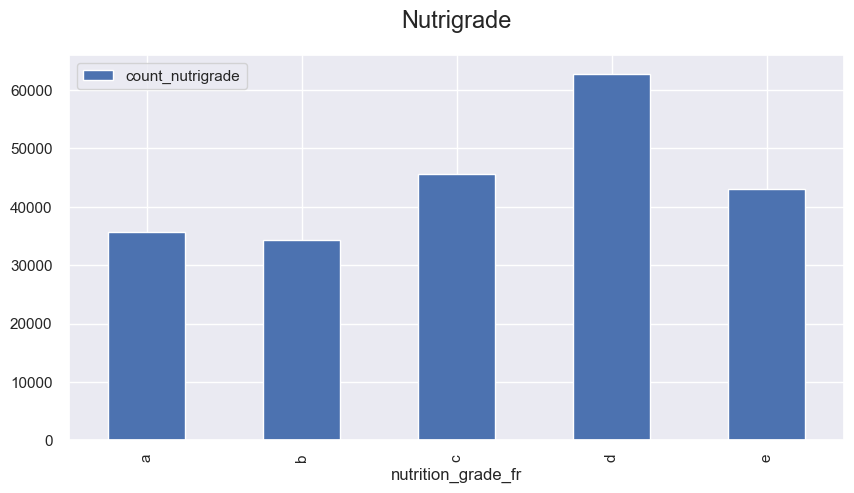

In [86]:
grouped_df_nutrigrade = df.groupby('nutrition_grade_fr').size().to_frame("count_nutrigrade").reset_index()

grouped_df_nutrigrade.plot(kind='bar', x='nutrition_grade_fr', y='count_nutrigrade')
plt.title('Nutrigrade', pad=20, fontsize=17)
plt.legend(loc='upper left')
plt.show()


#### <a id="d7">[4.7 pnns group](#toc)</a>


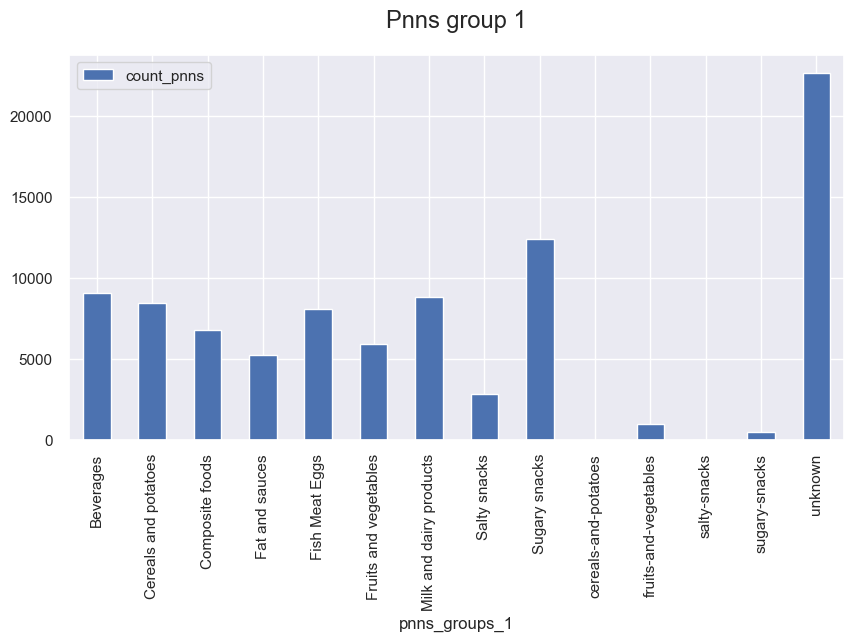

,pnns_groups_1,count_pnns
0,Beverages,9033
1,Cereals and potatoes,8442
2,Composite foods,6747
3,Fat and sauces,5216
4,Fish Meat Eggs,8041
5,Fruits and vegetables,5908
6,Milk and dairy products,8825
7,Salty snacks,2809
8,Sugary snacks,12368
9,cereals-and-potatoes,16


In [87]:
grouped_df_pnns = df.groupby('pnns_groups_1').size().to_frame("count_pnns").reset_index()


grouped_df_pnns.plot(kind='bar', x='pnns_groups_1', y='count_pnns')
plt.title('Pnns group 1', pad=20, fontsize=17)
plt.show()

display(grouped_df_pnns)


#### <a id="d8">[4.8 subset me this](#toc)</a>

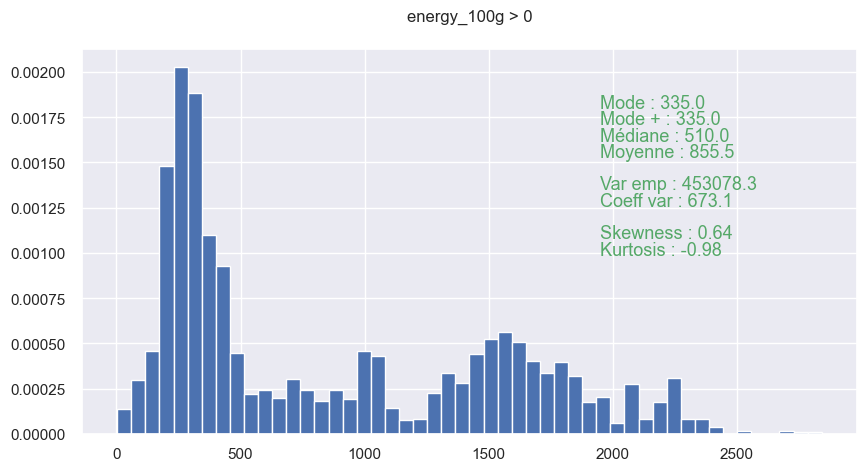

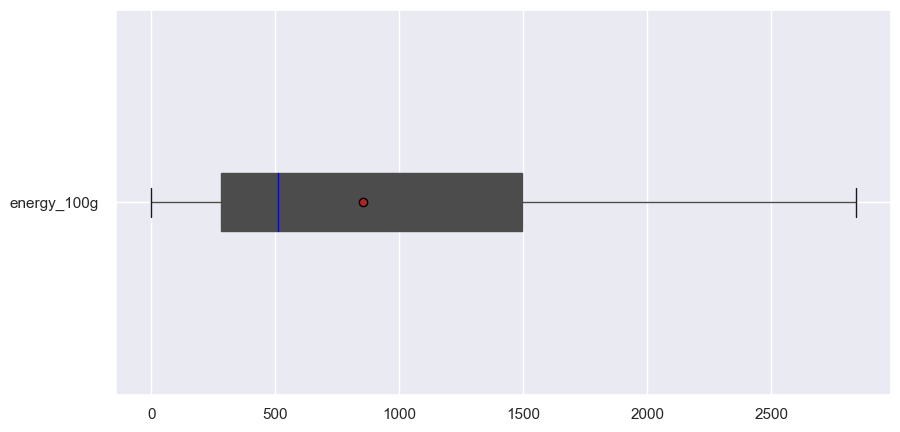

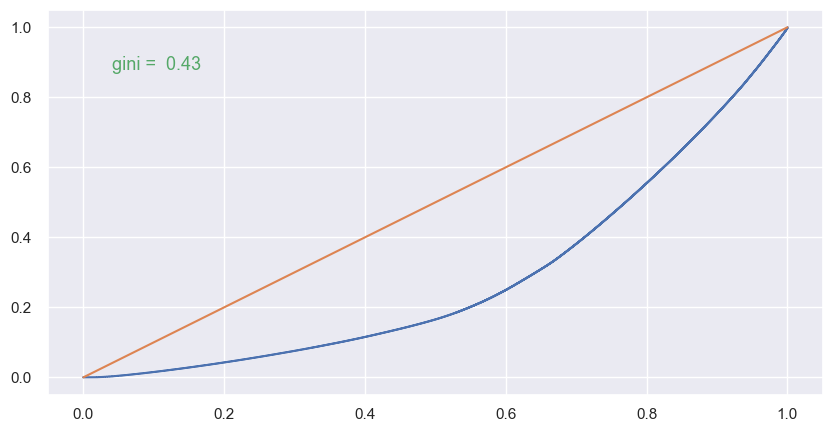

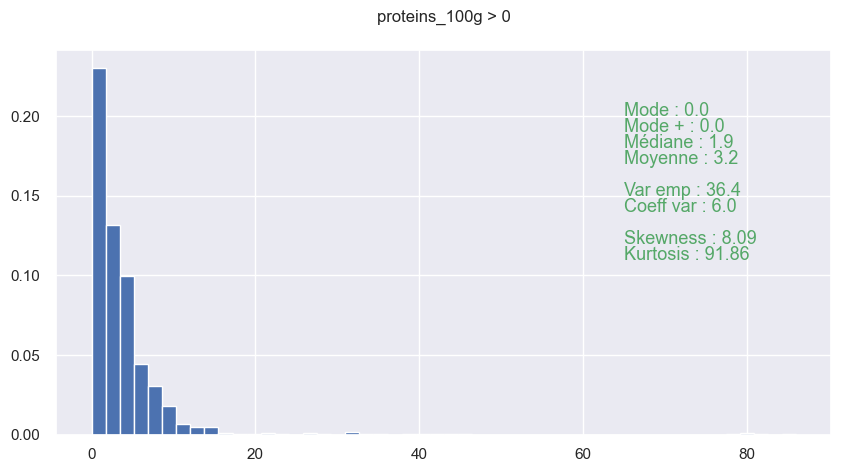

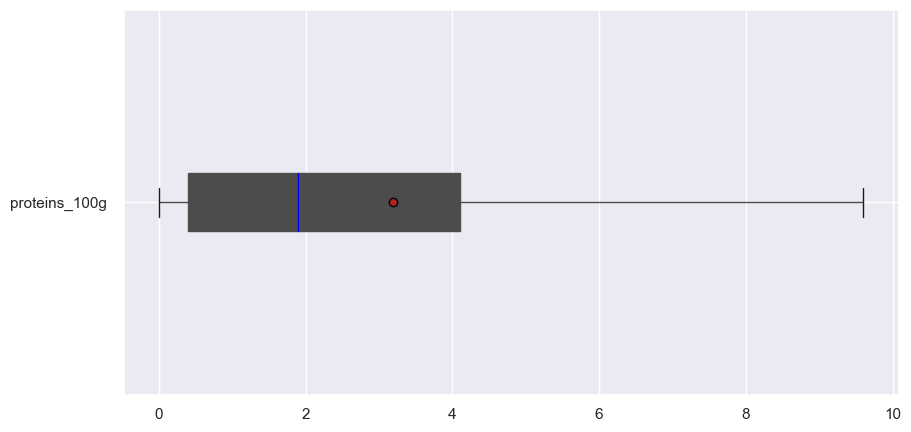

...

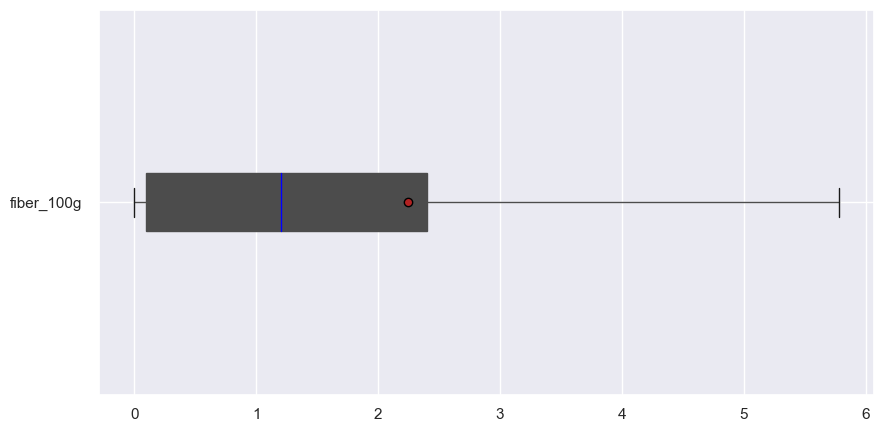

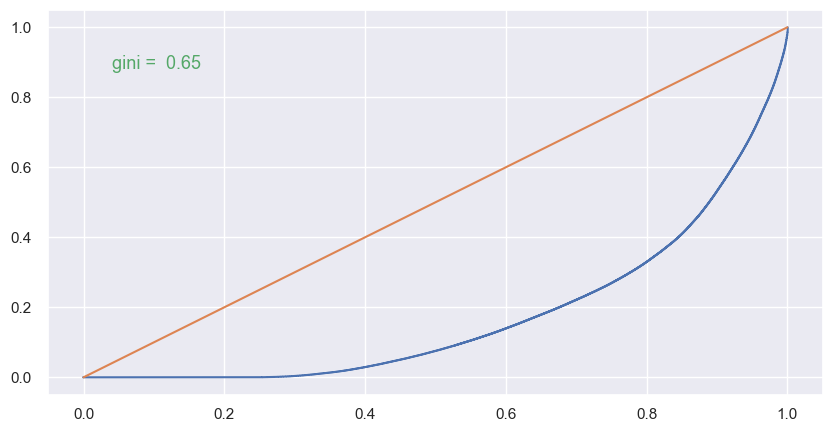

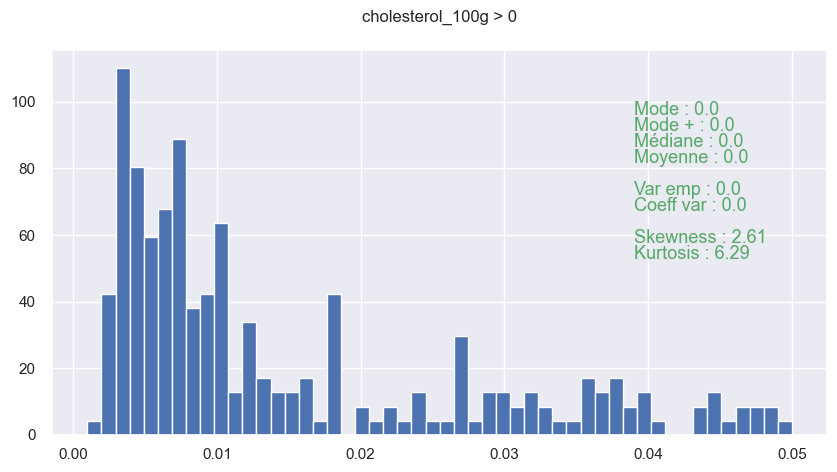

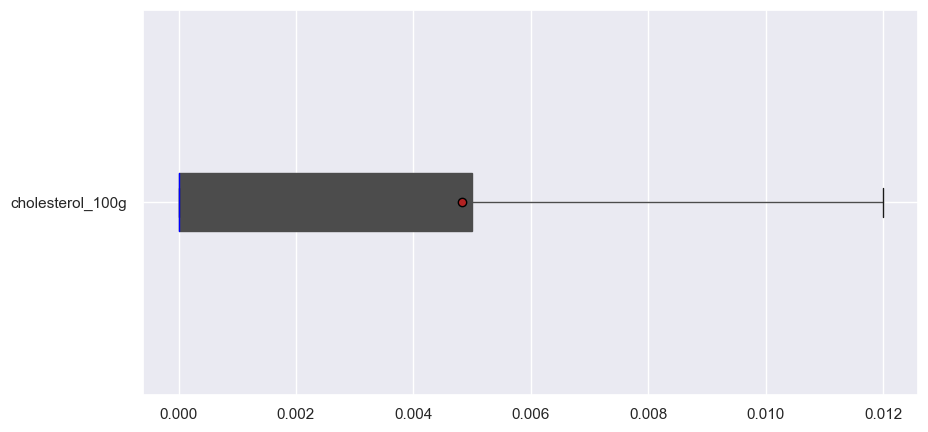

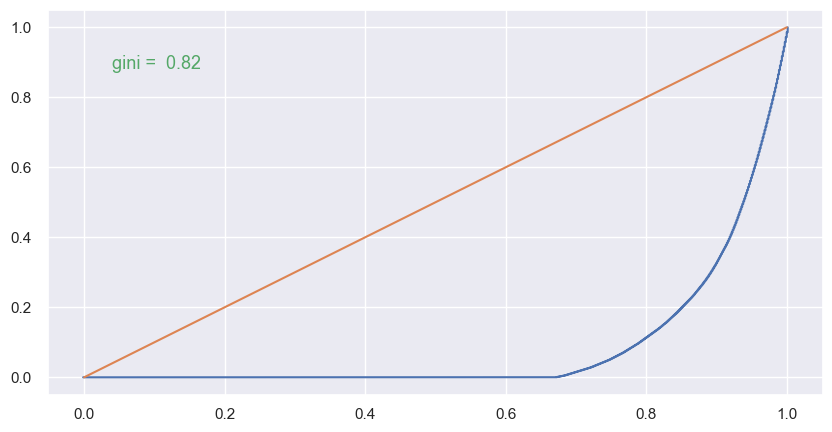

In [88]:
df['product_name'] = df['product_name'].str.lower()
df['product_name'].fillna("",inplace=True)
df['product_name'] = df['product_name'].astype("string")

def subset_me_this(liste):
    """
    Crée un subset de notre df, d'après une liste de mots 
    Argument : list str
    """
    subsets = []
    for mot in liste:
        subset = df.loc[df['product_name'].str.contains(mot), :].copy()
        subsets.append(subset)
    
    result = pd.concat(subsets, ignore_index=True).drop_duplicates().copy()
    return result

subset_fraise_banane = subset_me_this(['fraise','banan'])

for feature in features_str:
    if (feature.endswith("_100g") == True) and not (feature in ['nutrition-score-fr_100g']):
        graphs_analyse_uni(subset_fraise_banane, feature, bins=50, r=1)


In [89]:
subset_test = subset_me_this(['zzzooooooootrrrrrrrrrrrglubjsusuregxj'])

# Pas d'erreur ??


### Analyse bivariée


#### <a id="e1">[5.1 entre features numériques](#toc)</a>


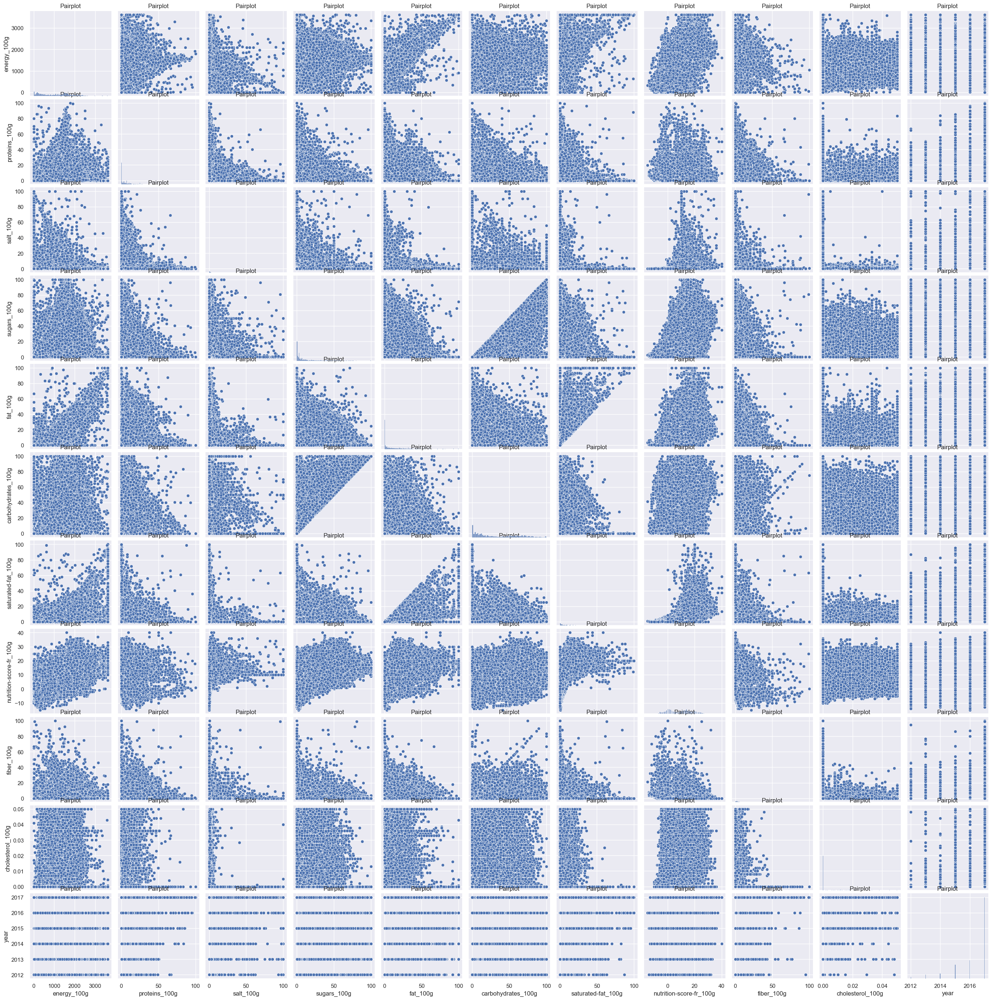

In [90]:
sns.pairplot(df).set(title='Pairplot')
# 1-2 min


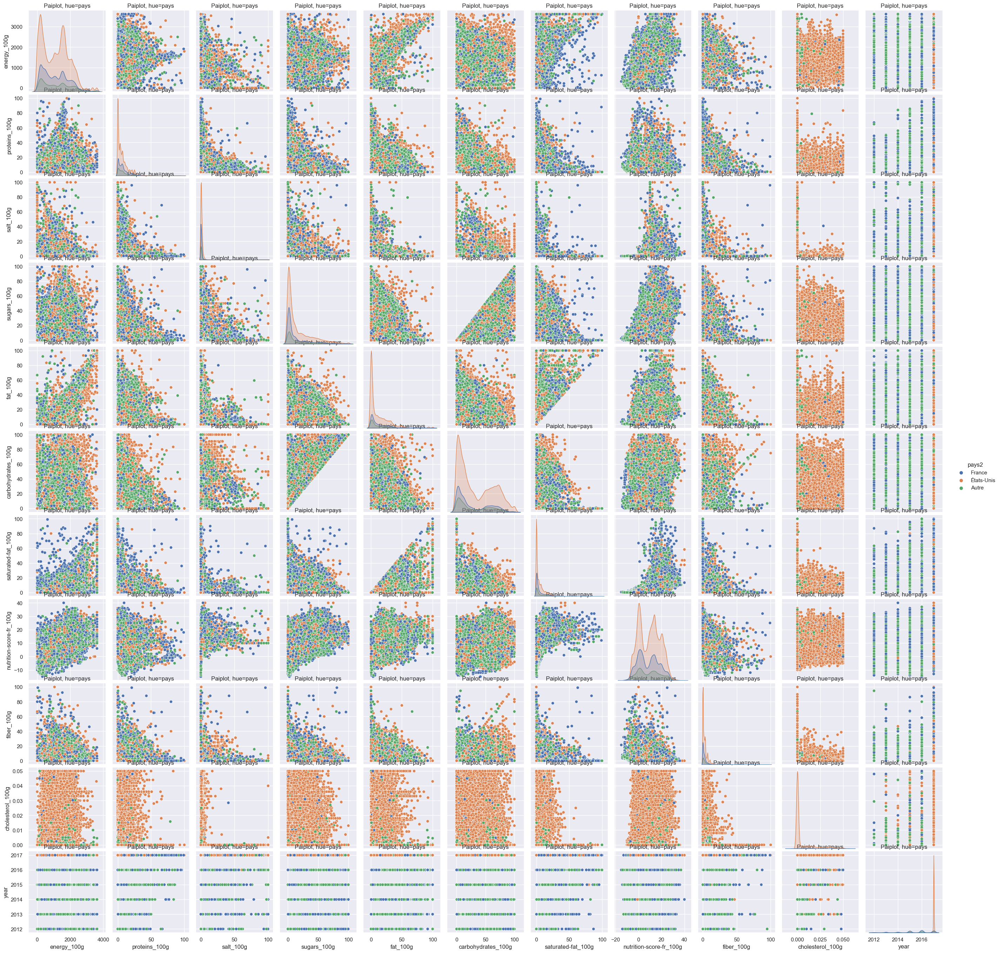

In [91]:
df['pays2'] = df['pays']
df.loc[(df['pays2'] != 'France') & (df['pays2'] != 'États-Unis'), 'pays2'] = 'Autre'

sns.pairplot(df, hue="pays2").set(title='Paiplot, hue=pays')

# Joli, mais
# Prend + de 20 min !

# tester sur subsets ?


In [92]:
# On remarque immediatement les features inclues ds d'autres ("triangles") :
#   sucres ds carbs, sat_fat ds fat
# Beaucoup à dire !
# Peu de relation modelisables par une fonction lineaire. energy/fat
# sugar/energy ds nutriscore ?

# Visualisons certaines corrélations suggérées par le pairplot,
# entre nos variables et le nutriscore,
# sous sa forme categorique (nutrigrade)


#### <a id="e2">[5.2 entre une feature numérique et une catégoique](#toc)</a>


Text(0.5, 1.0, 'Gras en fonction du nutriscore')

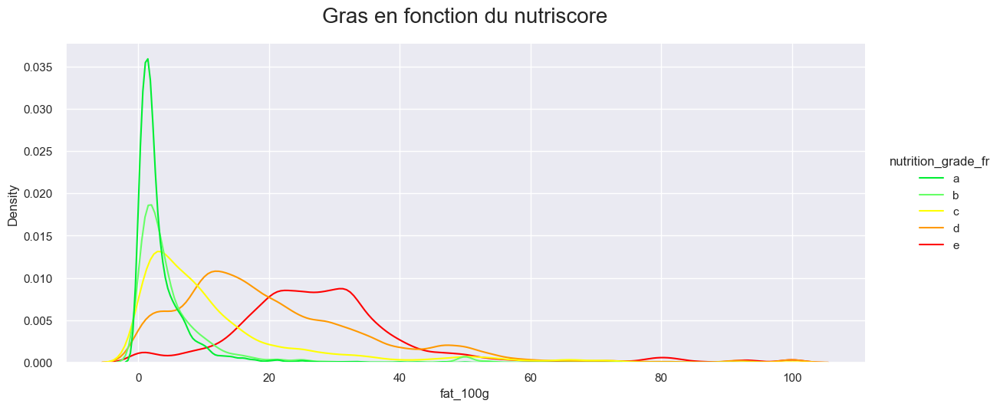

In [93]:
# hist (hue)

palette_nutri = ['#0e3','#6f6','#ff0','#f90','red']

sns.displot(df.loc[df['fat_100g'] >0, :], x="fat_100g", hue="nutrition_grade_fr", kind='kde', aspect=14/6,
            hue_order=['a','b','c','d','e'], 
            palette=palette_nutri)

plt.title('Gras en fonction du nutriscore', fontsize=20, pad=20)


Text(0.5, 1.0, 'Gras en fonction des pays')

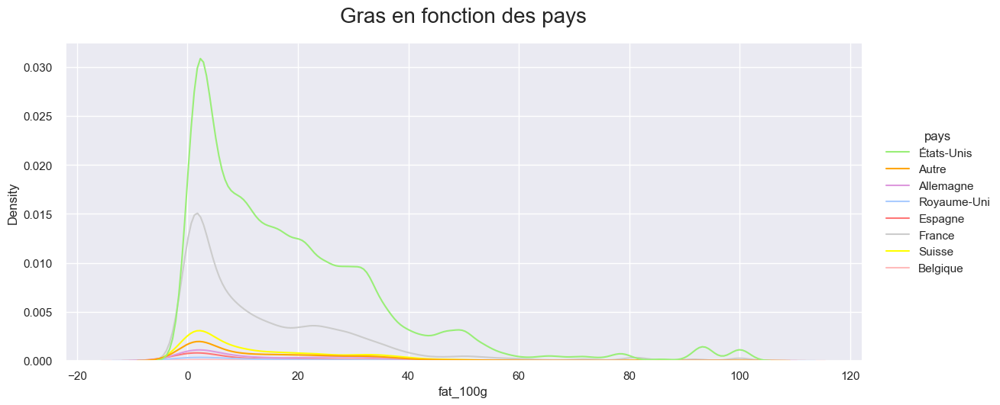

In [94]:
sns.displot(df.loc[df['fat_100g'] >0, :], x="fat_100g", hue="pays", kind='kde', aspect=14/6,
            palette=['#9e7','orange','#d9d','#acf','#f77','#ccc','yellow','#fbb'])

plt.title('Gras en fonction des pays', fontsize=20, pad=20)

# probleme tailles relatives des echantillons ?


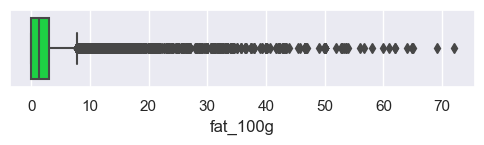

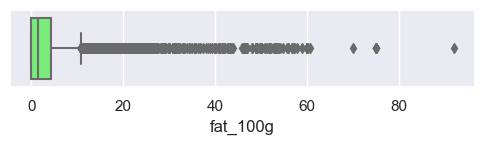

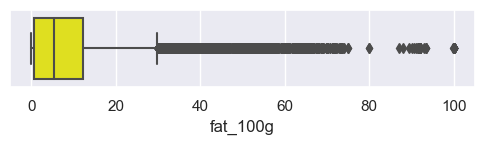

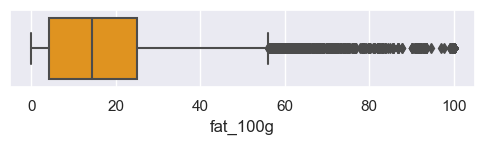

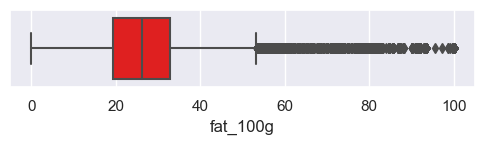

In [95]:
# + boxplot fat / nutrigrade 

sns.set(rc={'figure.figsize':(6,1)})

i_color=0 # encapsuler !

for grade in ['a','b','c','d','e']:
    sns.boxplot(df.loc[df['nutrition_grade_fr'] == grade, :], x="fat_100g", color = palette_nutri[i_color])
    i_color += 1
    plt.show()



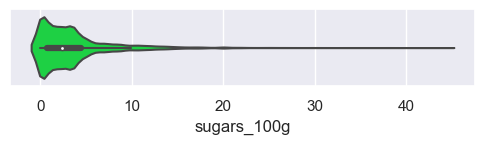

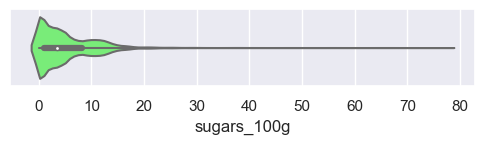

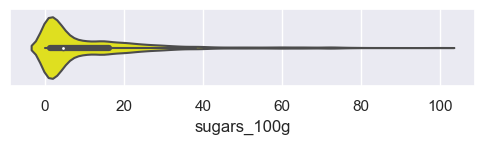

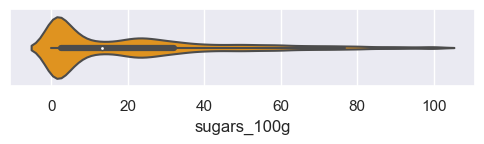

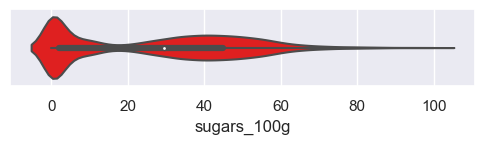

In [96]:
i_color=0 # encapsuler !

for grade in ['a','b','c','d','e']:
    sns.violinplot(df.loc[df['nutrition_grade_fr'] == grade, :], x="sugars_100g", color = palette_nutri[i_color])
    i_color += 1
    plt.show()


#### <a id="e3">[5.3 entre deux features catégoriques](#toc)</a>


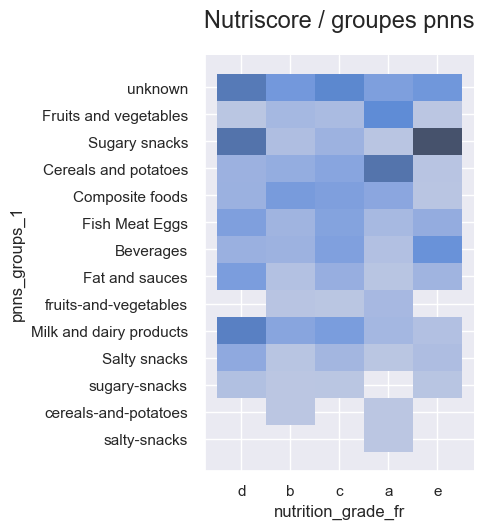

In [97]:
sns.displot(data=df, x="nutrition_grade_fr", row_order=['a','b','c','d','e'], y="pnns_groups_1")
# reordonner abscisse
plt.title('Nutriscore / groupes pnns', fontsize=17, pad=20)
plt.show()


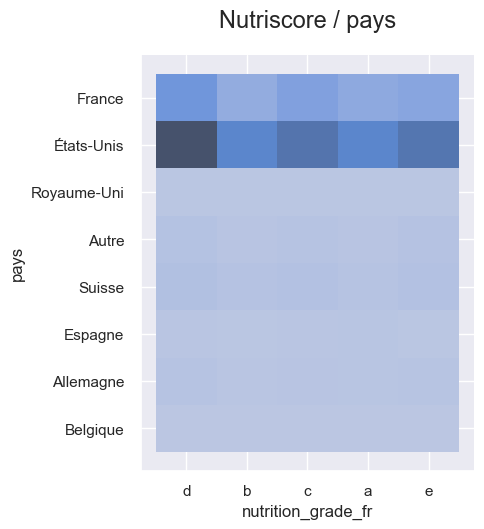

In [98]:
sns.displot(data=df, x="nutrition_grade_fr", y="pays")
plt.title('Nutriscore / pays', fontsize=17, pad=20)
plt.show()

# reordonner abscisse


### Imputation des valeurs manquantes


#### <a id="f1">[6.1 Prédire le nutrigrade : knn classifier, différents réglages](#toc)</a>


In [99]:
features_num =[]

for feature in features_str:
    if feature.endswith("_100g") == True:
            features_num.append(feature)

no_na_df = df.loc[df.isna().sum(axis = 1) == 0, features_num].copy()

print(no_na_df.shape)
display(no_na_df)

no_na_data = no_na_df.drop('nutrition-score-fr_100g', axis=1).copy()
# Trop facile avec le nutriscore !

no_na_target = df.loc[no_na_df.index, 'nutrition_grade_fr'].copy()

# Parfait ! Suffisant pour comparer la precision de nos imputers


(1597, 10)


,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g
106,1883.0,2.50,0.09652,57.500,20.00,70.00,12.500,22.0,2.500,0.01200
180,1090.0,3.33,0.64700,24.700,10.70,38.70,2.000,9.0,2.000,0.00533
181,1160.0,10.00,1.52000,1.110,1.11,53.30,0.333,1.0,2.220,0.00000
185,478.0,5.36,0.49900,0.714,6.79,7.86,2.860,2.0,0.357,0.01070
306,2243.0,7.14,0.95250,0.000,32.14,57.14,3.570,8.0,3.600,0.00000
...,...,...,...,...,...,...,...,...,...,...
319868,1804.0,19.60,0.11176,17.900,14.70,54.50,14.000,13.0,28.600,0.00000
320099,1020.0,8.40,1.01600,2.400,2.00,46.30,0.600,-1.0,2.700,0.00000
320121,393.0,3.00,0.01270,12.000,9.00,12.00,5.000,1.0,7.000,0.00000
320252,130.0,1.60,0.05588,0.400,2.60,0.40,0.200,0.0,0.000,0.00000


In [100]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(no_na_data, no_na_target, train_size=0.8)

# display(xtrain, xtest, ytrain, ytest)

In [101]:
# Pas de validation set (+ tard)
# Taille du sample déjà OK

from sklearn import neighbors

knn = neighbors.KNeighborsClassifier(n_neighbors=3)
knn.fit(xtrain, ytrain)


KNeighborsClassifier(n_neighbors=3)

In [102]:
print('error = ')
print(1 - knn.score(xtest, ytest), ' %')

error = 
0.47187500000000004  %


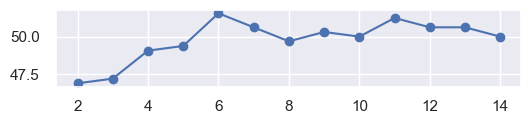

In [103]:
errors = []
for k in range(2,15):
    knn = neighbors.KNeighborsClassifier(k)
    errors.append(100*(1 - knn.fit(xtrain, ytrain).score(xtest, ytest)))
plt.plot(range(2,15), errors, 'o-')
plt.show()


error = 
0.43437499999999996  %


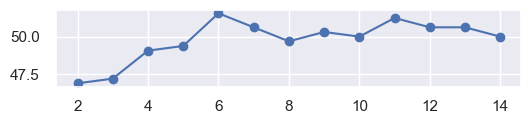

In [104]:
knn = neighbors.KNeighborsClassifier(n_neighbors=3, weights = 'distance')
knn.fit(xtrain, ytrain)

print('error = ')
print(1 - knn.score(xtest, ytest), ' %')

errors = []
for k in range(2,15):
    knn = neighbors.KNeighborsClassifier(k)
    errors.append(100*(1 - knn.fit(xtrain, ytrain).score(xtest, ytest)))
plt.plot(range(2,15), errors, 'o-')
plt.show()

# donnees non fittees !


error = 
0.43437499999999996  %


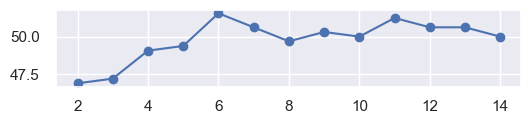

In [105]:
no_na_target.replace(['a', 'b', 'c', 'd', 'e'],
                     [0, 1, 2, 3, 4], inplace=True)

knn = neighbors.KNeighborsClassifier(n_neighbors=3, weights = 'distance')
knn.fit(xtrain, ytrain)

print('error = ')
print(1 - knn.score(xtest, ytest), ' %')

errors = []
for k in range(2,15):
    knn = neighbors.KNeighborsClassifier(k)
    errors.append(100*(1 - knn.fit(xtrain, ytrain).score(xtest, ytest)))
plt.plot(range(2,15), errors, 'o-')
plt.show()

error = 
0.290625  %


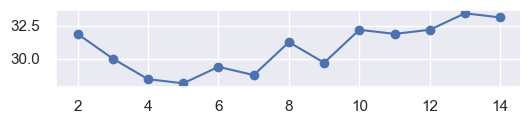

In [106]:
# Scale the features using StandardScaler
from sklearn.discriminant_analysis import StandardScaler

scaler = StandardScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.transform(xtest)

knn = neighbors.KNeighborsClassifier(n_neighbors=3, weights = 'distance')
knn.fit(xtrain, ytrain)

print('error = ')
print(1 - knn.score(xtest, ytest), ' %')
# c mieux !

errors = []
for k in range(2,15):
    knn = neighbors.KNeighborsClassifier(k)
    errors.append(100*(1 - knn.fit(xtrain, ytrain).score(xtest, ytest)))
plt.plot(range(2,15), errors, 'o-')
plt.show()

#### <a id="f2">[6.2 Comparaison de différents régresseurs](#toc)</a>

/home/ubuntu/anaconda3/envs/myenv_p2/lib/python3.11/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ubuntu/anaconda3/envs/myenv_p2/lib/python3.11/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


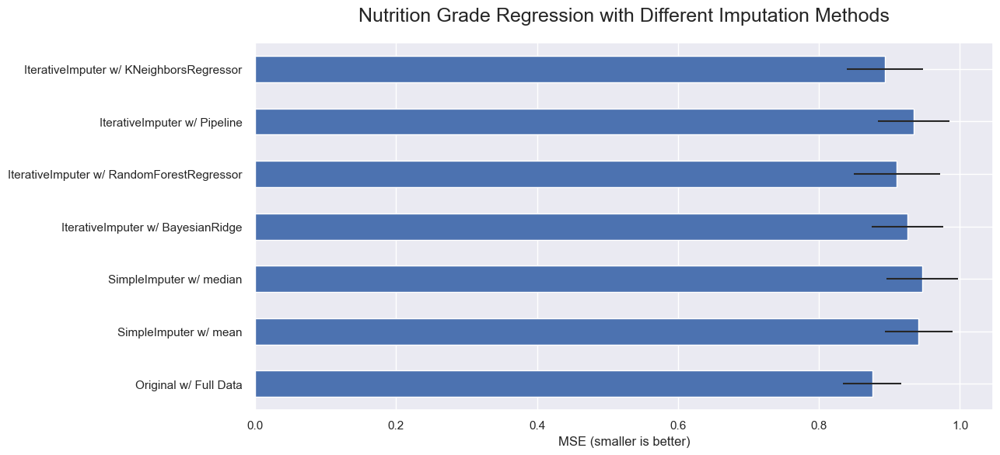

In [107]:
# on peut maintenant comparer avec les autres algos d'imputation

from sklearn.ensemble import RandomForestRegressor

# To use this experimental feature, we need to explicitly ask for it:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import BayesianRidge, Ridge
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import make_pipeline


X_train, X_test, y_train, y_test = train_test_split(no_na_data, no_na_target, test_size=0.2)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)

X_full = X_train.copy()
y_full = y_train

N_SPLITS = 5

rng = np.random.RandomState(0)


n_samples, n_features = X_full.shape

# Estimate the score on the entire dataset, with no missing values
br_estimator = BayesianRidge()
score_full_data = pd.DataFrame(
    cross_val_score(
        br_estimator, X_full, y_full, scoring="neg_mean_squared_error", cv=N_SPLITS
    ),
    columns=["Full Data"],
)

# Add a single missing value to each row
X_missing = X_full.copy()
y_missing = y_full
missing_samples = np.arange(n_samples)
missing_features = rng.choice(n_features, n_samples, replace=True)
X_missing[missing_samples, missing_features] = np.nan

# Estimate the score after imputation (mean and median strategies)
score_simple_imputer = pd.DataFrame()
for strategy in ("mean", "median"):
    estimator = make_pipeline(
        SimpleImputer(missing_values=np.nan, strategy=strategy), br_estimator
    )
    score_simple_imputer[strategy] = cross_val_score(
        estimator, X_missing, y_missing, scoring="neg_mean_squared_error", cv=N_SPLITS
    )

# Estimate the score after iterative imputation of the missing values
# with different estimators
estimators = [
    BayesianRidge(),
    RandomForestRegressor(
        # We tuned the hyperparameters of the RandomForestRegressor to get a good
        # enough predictive performance for a restricted execution time.
        n_estimators=4,
        max_depth=10,
        bootstrap=True,
        max_samples=0.5,
        n_jobs=2,
        random_state=0,
    ),
    make_pipeline(
        Nystroem(kernel="polynomial", degree=2, random_state=0), Ridge(alpha=1e3)
    ),
    KNeighborsRegressor(n_neighbors=15),
]
score_iterative_imputer = pd.DataFrame()
# iterative imputer is sensible to the tolerance and
# dependent on the estimator used internally.
# we tuned the tolerance to keep this example run with limited computational
# resources while not changing the results too much compared to keeping the
# stricter default value for the tolerance parameter.
tolerances = (1e-3, 1e-1, 1e-1, 1e-2)
for impute_estimator, tol in zip(estimators, tolerances):
    estimator = make_pipeline(
        IterativeImputer(
            random_state=0, estimator=impute_estimator, max_iter=25, tol=tol
        ),
        br_estimator,
    )
    score_iterative_imputer[impute_estimator.__class__.__name__] = cross_val_score(
        estimator, X_missing, y_missing, scoring="neg_mean_squared_error", cv=N_SPLITS
    )

scores = pd.concat(
    [score_full_data, score_simple_imputer, score_iterative_imputer],
    keys=["Original", "SimpleImputer", "IterativeImputer"],
    axis=1,
)

# plot results
fig, ax = plt.subplots(figsize=(13, 6))
means = -scores.mean()
errors = scores.std()
means.plot.barh(xerr=errors, ax=ax)
ax.set_title("Nutrition Grade Regression with Different Imputation Methods", fontsize=18, pad=20)
ax.set_xlabel("MSE (smaller is better)")
ax.set_yticks(np.arange(means.shape[0]))
ax.set_yticklabels([" w/ ".join(label) for label in means.index.tolist()])
plt.tight_layout(pad=1)
plt.show()

#### <a id="f3">[6.3 Traitement des valeurs manquantes : données catégoriques](#toc)</a>

In [108]:
# ca donne quoi avec les vm ?
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.discriminant_analysis import StandardScaler

def fill_na_hgbc(feature):
    """
    Remplace les na d'une feature catégorique par les valeurs imputées en utilisant
    HistGradientBoostingClassifier
    Argument : feature (cat)
    """
    xtrain = df.loc[df[feature].notna(), features_num].copy()
    xtest = df.loc[df[feature].isna(), features_num].copy()
    # display(xtrain,xtest)
    ytrain = df.loc[df[feature].notna(), feature].copy()

    # Scale the features using StandardScaler
    scaler = StandardScaler()
    xtrain = scaler.fit_transform(xtrain)
    xtest = scaler.transform(xtest)

    clf = HistGradientBoostingClassifier().fit(xtrain, ytrain)

    print('Score = ', clf.score(xtrain, ytrain))
    # print(clf.predict(xtest))
    df.loc[df[feature].isna(), feature] = clf.predict(xtest)


In [109]:
fill_na_hgbc('nutrition_grade_fr')


Score =  0.9997739704353329


In [110]:
df.loc[df['pnns_groups_1'] == 'salty-snacks', 'pnns_groups_1'] = 'Salty snacks'
df.loc[df['pnns_groups_1'] == 'cereals-and-potatoes', 'pnns_groups_1'] = 'Cereals and potatoes'

fill_na_hgbc('pnns_groups_1')


Score =  0.7115538022751363


#### <a id="f4">[6.4 Traitement des valeurs manquantes : données numériques](#toc)</a>

In [111]:
from sklearn.ensemble import HistGradientBoostingRegressor

def fill_na_hgbr(feature):
    """
    Remplace les na d'une feature numérique par les valeurs imputées en utilisant
    HistGradientBoostingRegressor
    Argument : feature num
    """
    xtrain = df.loc[df[feature].notna(), features_num].copy()
    xtest = df.loc[df[feature].isna(), features_num].copy()
    # display(xtrain,xtest)
    ytrain = df.loc[df[feature].notna(), feature].copy()

    # Scale the features using StandardScaler
    scaler = StandardScaler()
    xtrain = scaler.fit_transform(xtrain)
    xtest = scaler.transform(xtest)

    est = HistGradientBoostingRegressor().fit(xtrain, ytrain)

    print('Score = ', est.score(xtrain, ytrain))
    # print(clf.predict(xtest))
    df.loc[df[feature].isna(), feature] = est.predict(xtest)

for f in features_num:
    fill_na_hgbr(f)




Score =  0.9999547695093448
Score =  0.998975378091278
Score =  0.9839402443487816
Score =  0.9998880585958224
Score =  0.9998696821857285
Score =  0.9999696391149924
Score =  0.9972547714714275
Score =  0.9999983746737946
Score =  0.9932935025984096
Score =  0.9998225223349946


### ACP

#### <a id="g1">[7.1 Scaling](#toc)</a>

In [112]:
from sklearn.decomposition import PCA

df_num = df.loc[:, features_num].copy()

X = df_num.values

names = df['product_name'].copy()

features = df_num.columns

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

idx = ["mean", "std"]
pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]



,0,1,2,3,4,5,6,7,8,9
mean,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


#### <a id="g2">[7.2 ](#toc)</a>

In [113]:
n_components = 6

pca = PCA(n_components=n_components)

pca.fit(X_scaled)

pca.explained_variance_ratio_
# 70% de la variance captée sur 4 composantes


array([0.30604817, 0.16194884, 0.14715097, 0.10228822, 0.09897619,
       0.06280687])

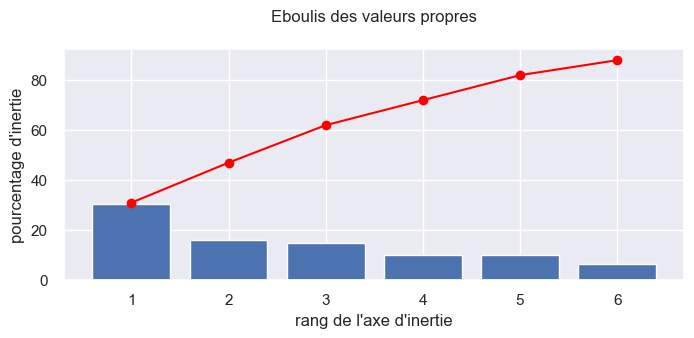

In [114]:
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()

x_list = range(1, n_components+1)

sns.set(rc={'figure.figsize':(8,3)})

plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres", pad=20)
plt.show(block=False)


In [115]:
pcs = pca.components_
pcs = pd.DataFrame(pcs)
pcs.columns = features
pcs.index = [f"F{i}" for i in x_list]

display(pcs, pcs.T)


,energy_100g,proteins_100g,salt_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,cholesterol_100g
F1,0.537191,0.232984,-0.018326,0.264919,0.444275,0.301456,0.423479,0.286069,0.176542,0.077675
F2,-0.024195,0.270612,0.085182,-0.581451,0.336701,-0.588092,0.311116,0.068611,-0.128840,0.059355
F3,0.079387,0.449038,-0.054684,-0.220652,-0.007632,0.117563,-0.163597,-0.557836,0.622260,-0.036783
F4,0.035340,-0.016389,0.738073,-0.027928,-0.001491,0.033810,-0.024717,0.124096,0.122273,-0.648725
F5,-0.057877,0.166539,0.643830,0.056263,-0.115978,0.088371,-0.080131,-0.005271,-0.037463,0.722578
F6,0.022732,-0.781512,0.107222,-0.137527,0.296541,-0.065913,0.129389,-0.170887,0.429749,0.188156


,F1,F2,F3,F4,F5,F6
energy_100g,0.537191,-0.024195,0.079387,0.035340,-0.057877,0.022732
proteins_100g,0.232984,0.270612,0.449038,-0.016389,0.166539,-0.781512
salt_100g,-0.018326,0.085182,-0.054684,0.738073,0.643830,0.107222
sugars_100g,0.264919,-0.581451,-0.220652,-0.027928,0.056263,-0.137527
fat_100g,0.444275,0.336701,-0.007632,-0.001491,-0.115978,0.296541
carbohydrates_100g,0.301456,-0.588092,0.117563,0.033810,0.088371,-0.065913
saturated-fat_100g,0.423479,0.311116,-0.163597,-0.024717,-0.080131,0.129389
nutrition-score-fr_100g,0.286069,0.068611,-0.557836,0.124096,-0.005271,-0.170887
fiber_100g,0.176542,-0.128840,0.622260,0.122273,-0.037463,0.429749
cholesterol_100g,0.077675,0.059355,-0.036783,-0.648725,0.722578,0.188156


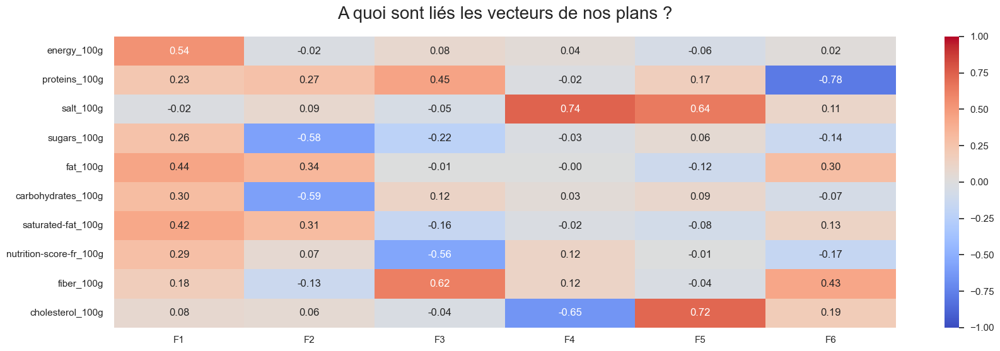

In [116]:
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")
plt.title('A quoi sont liés les vecteurs de nos plans ?', fontsize=20, pad=20)
plt.show()

# F1 l'energie, donc le gras en gros
# F2 le "non-sucré"
# F3 c les "bonnes choses" !
# F4 le sel sans cholesterol ?
# ...


In [117]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

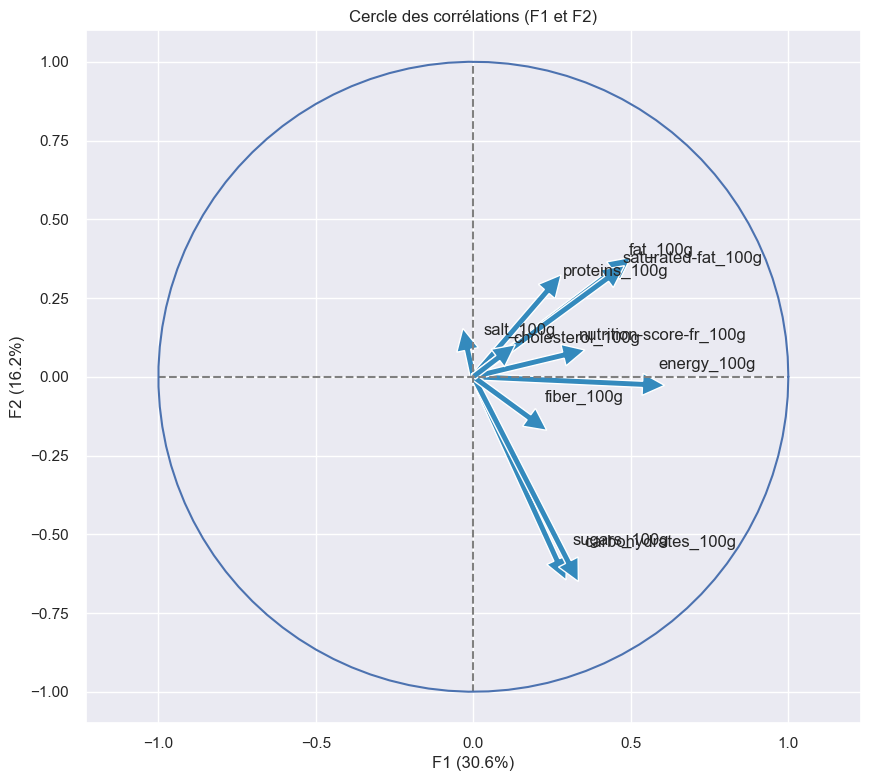

In [118]:
x_y = (0,1)

correlation_graph(pca, x_y, features)


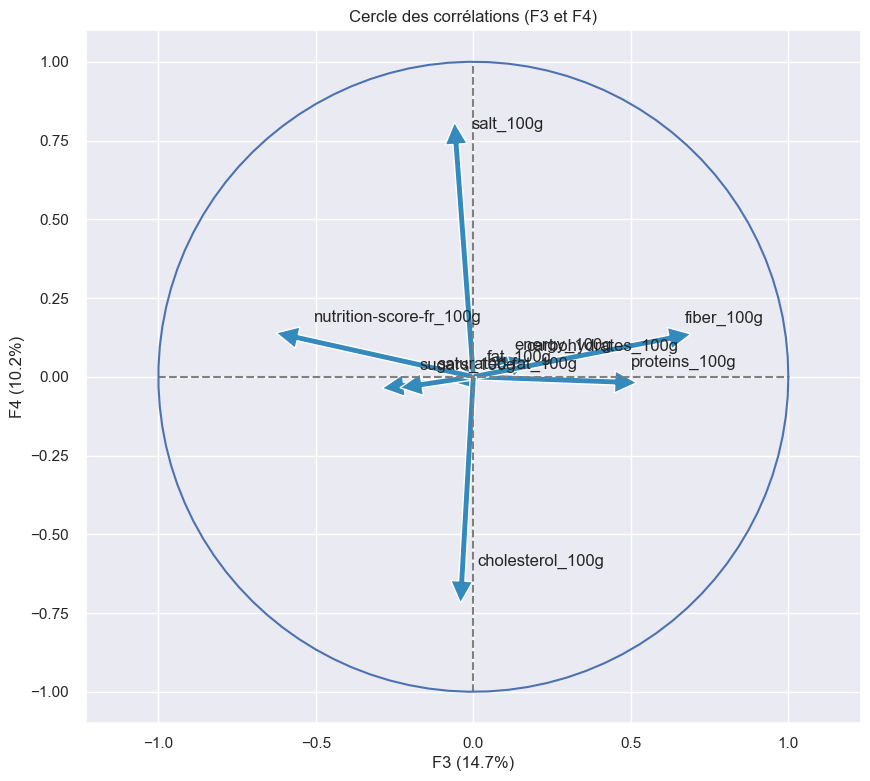

In [119]:
correlation_graph(pca, (2,3), features)


In [120]:
X_proj = pca.transform(X_scaled)

def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        # ou pas :)
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()


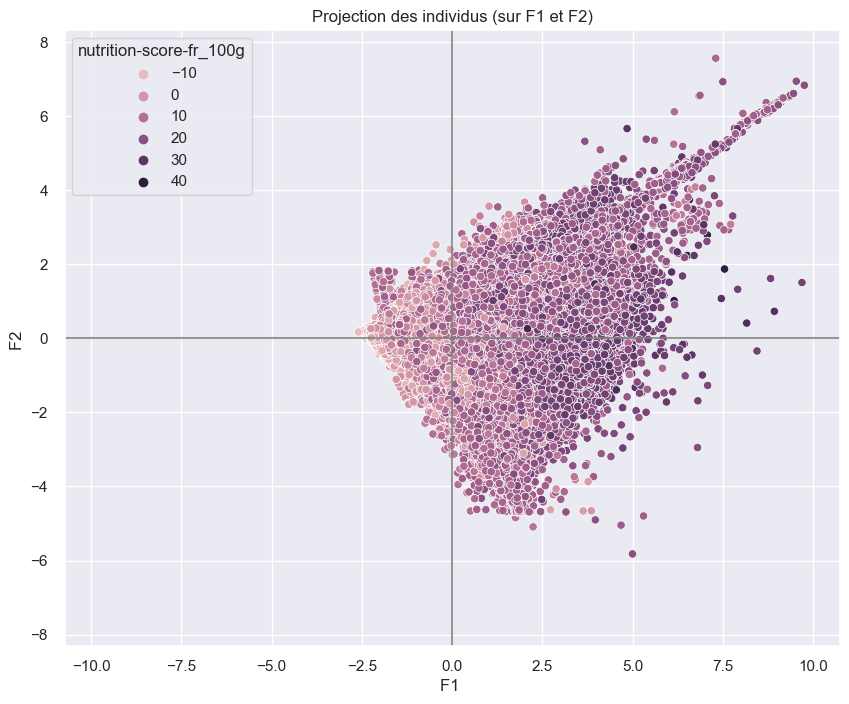

In [121]:
display_factorial_planes(X_proj, [0,1], clusters=df['nutrition-score-fr_100g'])
